## Information Bottlenecks for Attribution

In order to address the question of 'what part of the CT scan did the model use to make predictions' or 'what kind of features does the model use to predict ink' we can formulate this problem as an attribution question from XAI. 
Information bottlenecks formulates this problem by rephrasing the question: how much information can we throw away while keeping the same prediction intact?
Information bottlenecks have been successfully applied to generate explanations from vision models, and this is my attempt at using IBA for ink detection models. 

First, when we say how much information we can throw away, this typically means how much information can we replace with noise while minimizing the prediction loss. 
IBA presents this objective as a 2 loss optimization objective, one with a gate parameter that minimizes the flow of information at a certain stage in the network, and the prediction loss that we want to keep intact. The tradeoff between these two losses is controlled by a parameter beta

Without getting into the gritty details of IBA, I make the following assumptions that simplify the computation:
1- I place the bottleneck outside of the network to make it easier to plug the attribution into different models
2- I define the noise as the no signal image, and I take an image outside of the prediction stack (the 30 volume layers fed to the model), usually layer 12 or layer 48. This gives us a constant noise which simplifies the loss, while also keeping the network activations in distribution, since the no signal image is still that of papyrus. 

## Information Bottleneck Attribution [https://arxiv.org/abs/2001.00396]

The Information Bottleneck (IB) method reformulates the attribution problem by asking:

> How much information can we discard while maintaining the same prediction?

IBA has been successfully applied to generate explanations for vision models, and this section describes an attempt to apply IBA to ink detection models in CT scans.

### Key Concepts

1. **Information Reduction**: The core idea is to replace parts of the input with noise while minimizing the change in prediction.

2. **Optimization Objective**: IBA presents a two-part optimization objective:
   a) A gate parameter that minimizes information flow at a specific network stage.
   b) The prediction loss that should remain intact.

3. **Trade-off Parameter**: The balance between these two losses is controlled by a parameter β (beta).

## Simplified IBA Implementation

To simplify the computation, the following assumptions are made:

1. **Bottleneck Placement**: The bottleneck is placed outside the network for easier integration with different models.

2. **Noise Definition**: The noise is defined as a "no signal" image, taken from outside the prediction stack (typically layer 12 or 48 of the 30 volume layers fed to the model).

This approach provides a constant noise, simplifying the loss calculation while keeping network activations in distribution, as the "no signal" image still represents papyrus.

### Input Function

The modified input function becomes:

$$X' = \alpha X + (1 - \alpha) X_{noise}$$

Where:
- $X'$ is the modified input
- $X$ is the original input
- $X_{noise}$ is the "no signal" image
- $\alpha$ is the parameter to be minimized
Now it's clear that if we want to minimize the amount of information flowing, we need to minimize the alpha :) 



## Differential Masking [https://arxiv.org/abs/2004.14992]

A modification to the IBA approach heavily based on the differential masking paper with the same set of heuristics introduced above. The idea is to introduce a set of probabilities (gates) for each depth, during optimization, we sample the state of the gate and use it to interpolate between signal and noise, the idea being that a gate state (open/closed) is prefered over continuous interpolation, so that we either use the signal or the noise, and less of something in between. keep in mind that the sampling is not completely binary in order to to be differentiable. 

IBA offers a more stable optimization, while differential masking can offer a better bound on the letters locations

In [1]:
import wandb
import os
import PIL.Image
PIL.Image.MAX_IMAGE_PIXELS = 933120000
os.environ["OPENCV_IO_MAX_IMAGE_PIXELS"] = str(pow(2,40))
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.metrics import fbeta_score
import numpy as np
import pytorch_lightning as pl
import gc
import random
import scipy as sp
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import argparse
from torch.utils.data import DataLoader, Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

# from PIL import Image
# Image.MAX_IMAGE_PIXELS = None
# import os
from InkIba import *
from externals.models import I3DD

C:\Users\Youssef\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


## config

In [2]:
class CFG:
   
    in_chans = 30 # 65
    # ============== training cfg =============
    size = 512
    tile_size = 512
    stride = tile_size // 2
    train_batch_size = 16 # 32
    valid_batch_size = 16
    num_workers = 16
    seed = 42
    # ============== augmentation =============
    valid_aug_list = [
        A.Resize(size, size),
        A.Normalize(
            mean= [0] * in_chans,
            std= [1] * in_chans
        ),
        ToTensorV2(transpose_mask=True),
    ]
    path_to_scrolls='C:/PHerc1667.volpkg/paths'

## helper

In [3]:

def set_seed(seed=None, cudnn_deterministic=True):
    if seed is None:
        seed = 42

    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = cudnn_deterministic
    torch.backends.cudnn.benchmark = False
def cfg_init(cfg, mode='train'):
    set_seed(cfg.seed)
cfg_init(CFG)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## image, mask

In [4]:
from scipy import ndimage
from scipy.ndimage import zoom
def read_image_mask(fragment_id,start_idx=24,end_idx=40,rotation=0):
    
    images = []
    idxs = range(start_idx, end_idx)

    for i in tqdm(idxs):
        image = cv2.imread(f"{CFG.path_to_scrolls}/{fragment_id}/layers/{i:02}.tif", 0)

        pad0 = (256 - image.shape[0] % 256)
        pad1 = (256 - image.shape[1] % 256)

        image = np.pad(image, [(0, pad0), (0, pad1)], constant_values=0)
        images.append(image)
    images = np.stack(images, axis=2)
    if fragment_id in ['20230701020044','verso','20230901184804','20230901234823','20230531193658','20231007101615','20231005123333','20231011144857','20230522215721', '20230919113918', '20230625171244','20231022170900','20231012173610','20231016151000']:        
        images=images[:,:,::-1]
    fragment_mask=None
    if os.path.exists(f'C:/PHerc1667.volpkg/paths/{fragment_id}/{fragment_id}_mask.png'):
        fragment_mask=cv2.imread(f"{CFG.path_to_scrolls}/{fragment_id}/{fragment_id}_mask.png", 0)
        fragment_mask = np.pad(fragment_mask, [(0, pad0), (0, pad1)], constant_values=0)
    if os.path.exists(f'{CFG.path_to_scrolls}/{fragment_id}/{fragment_id}_mask.tiff'):
        fragment_mask=cv2.imread(f"{CFG.path_to_scrolls}/{fragment_id}/{fragment_id}_mask.tiff", 0)
        fragment_mask = np.pad(fragment_mask, [(0, pad0), (0, pad1)], constant_values=0)
    mask=cv2.imread(f"{CFG.path_to_scrolls}/{fragment_id}/{fragment_id}_inklabels.png", 0)
    mask = mask.astype('float32')
    mask/=255
    return images,fragment_mask,mask

# Hyperparams

The hyperparams for the attribution experiments.

In [5]:
label_mode=0
t=A.Compose(CFG.valid_aug_list)
N_STEPS=100
LR=1e-1
BETA=0.5
SIZE=CFG.size
loss_func1 = smp.losses.DiceLoss(mode='binary')
loss_func2= smp.losses.SoftBCEWithLogitsLoss(smooth_factor=0.15)
loss_func= lambda x,y:0.5 * loss_func1(x,y)+0.5*loss_func2(x,y)
fragment_id=''

In [6]:
t2=A.Compose([
        A.Resize(CFG.size, CFG.size),
        A.Normalize(
            mean= [0],
            std= [1]
        ),
        ToTensorV2(transpose_mask=True),
    ])

In [7]:
model=I3DD()
model.load_state_dict(torch.load('../wild12_i3d.pt'))
model.eval()
model.cuda();

In [8]:
image,fragment_mask,mask_2d = read_image_mask('20231016151000',12,50,0)


  0%|          | 0/38 [00:00<?, ?it/s]

# Picking a cutout
to test the attribution methods, we need to select the prediction cutout we want to explain (the input), if you have some coordinates for some letter you want to explain you can use those.   
Here I will just check the connected components and pick a random letter. 

4414 2462


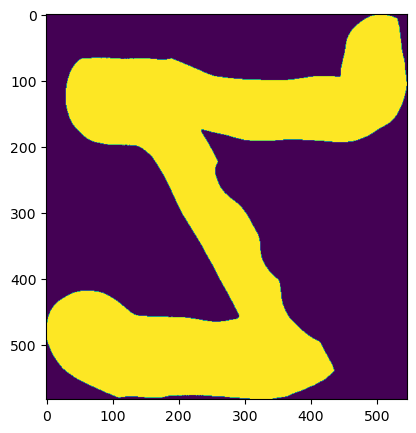

4421 1533


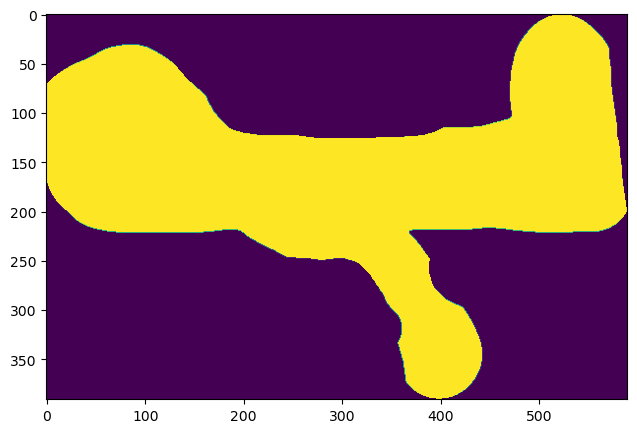

4452 3371


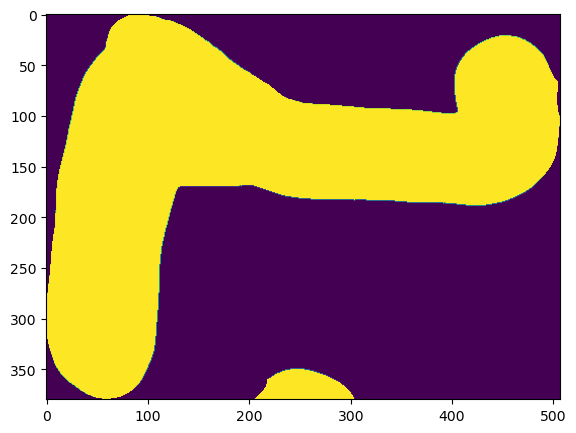

4454 4921


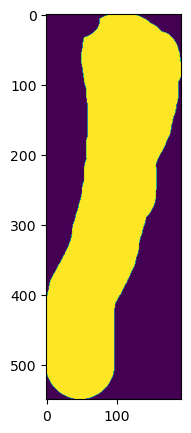

4471 4604


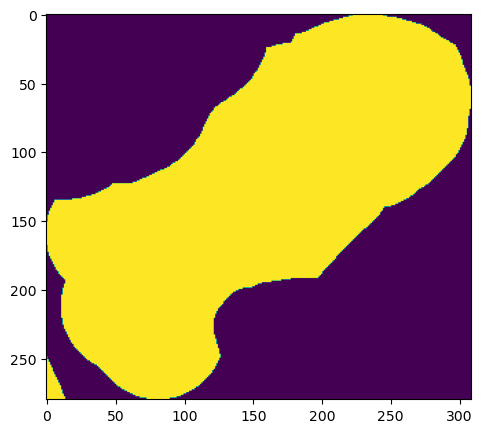

4475 4305


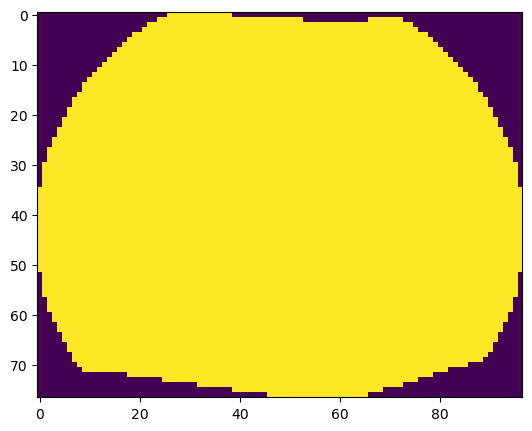

4510 711


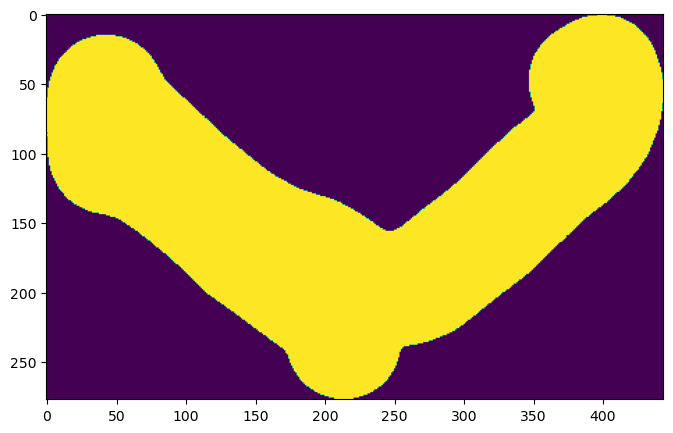

4599 4409


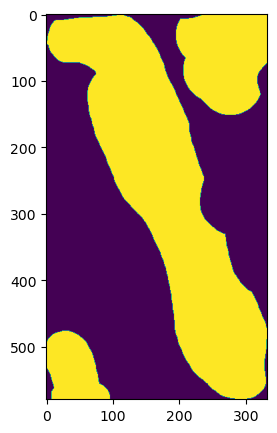

4802 3332


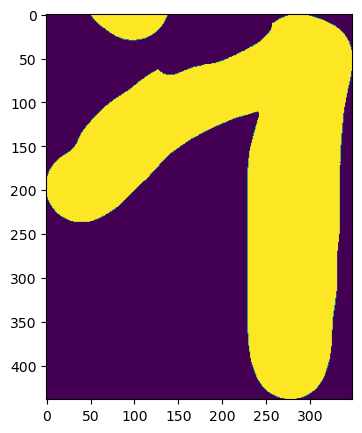

4850 837


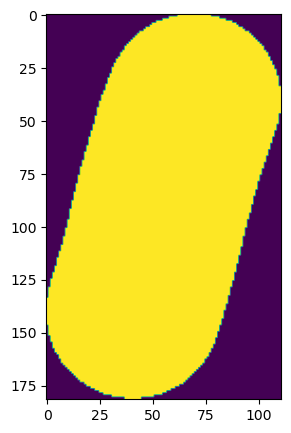

4918 1584


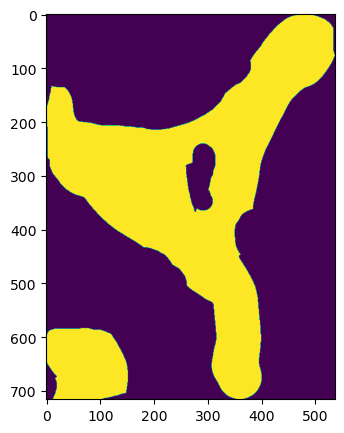

5021 701


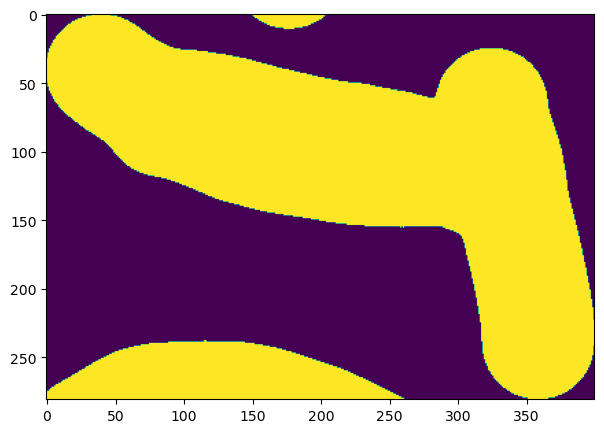

5034 4278


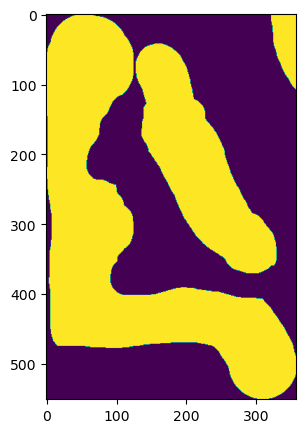

5052 2452


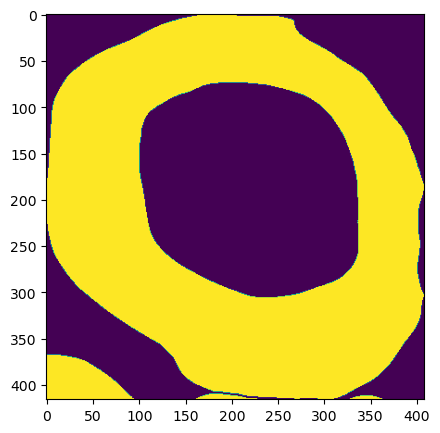

5076 4406


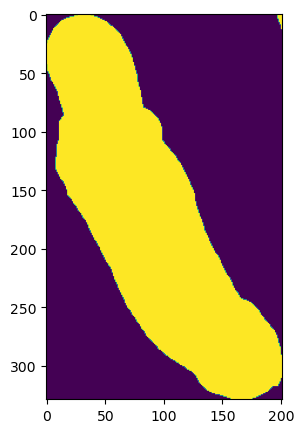

5259 636


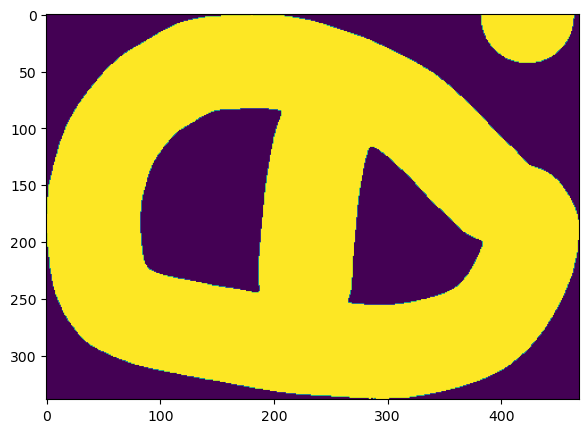

5296 3343


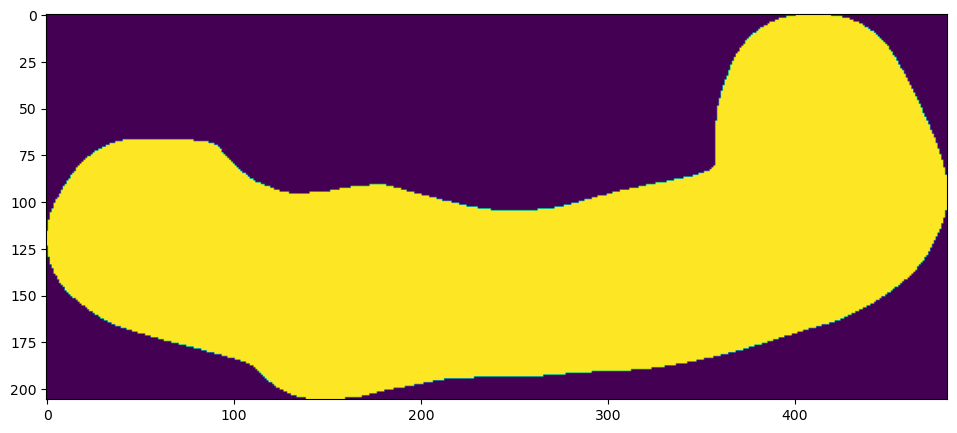

5420 2394


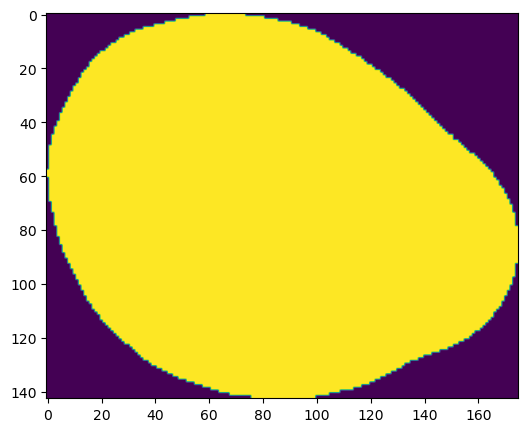

5462 2595


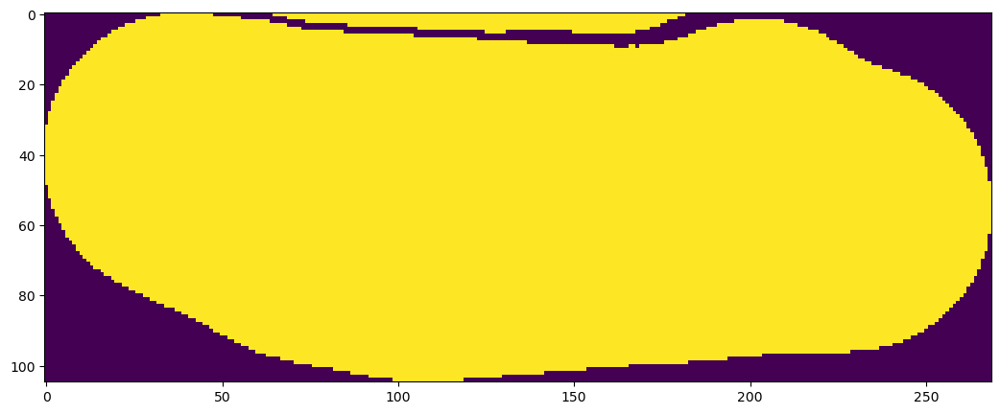

5502 1526


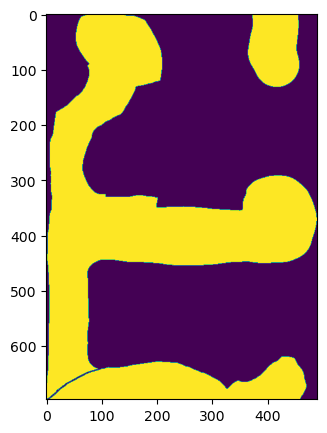

5544 3324


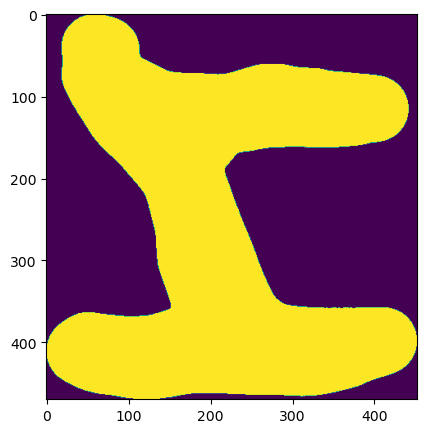

5597 4239


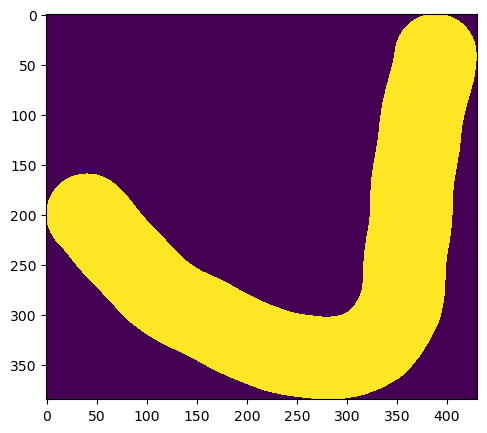

5743 637


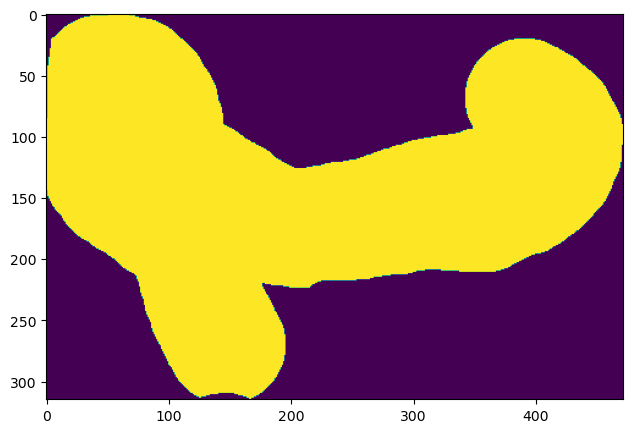

5750 2353


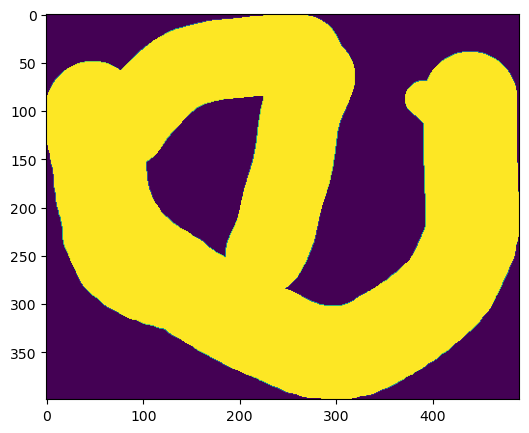

6052 4212


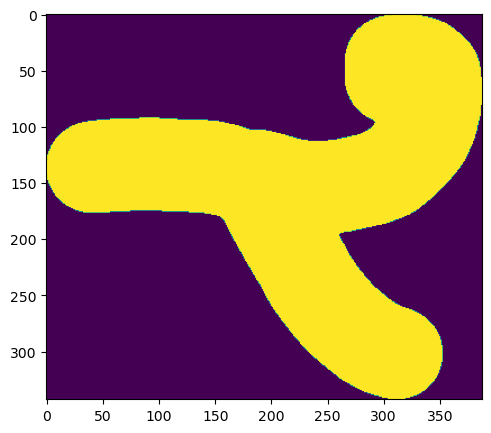

6068 566


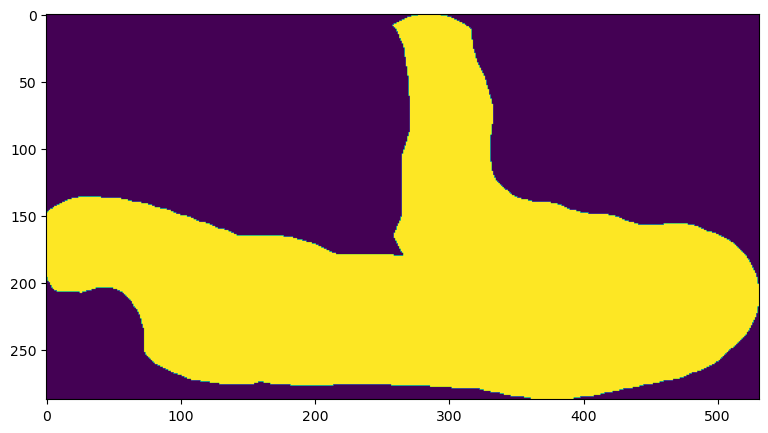

6122 1495


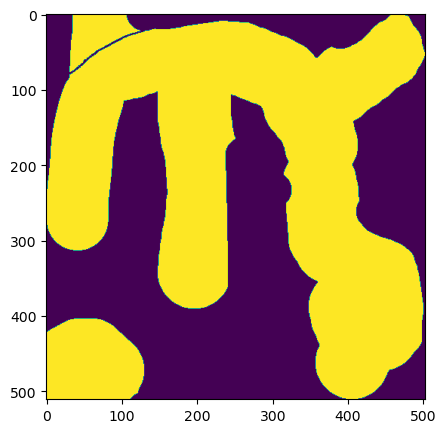

6143 3258


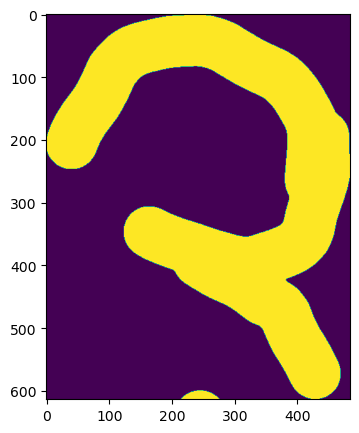

6212 2358


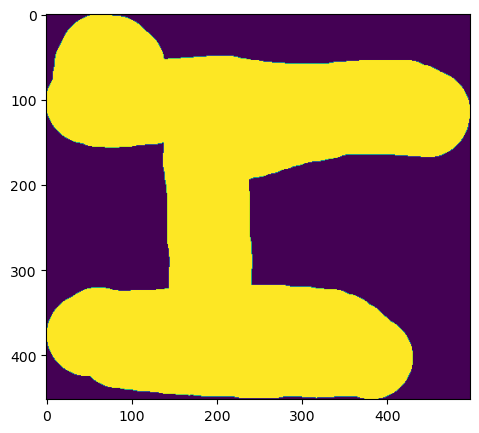

6400 536


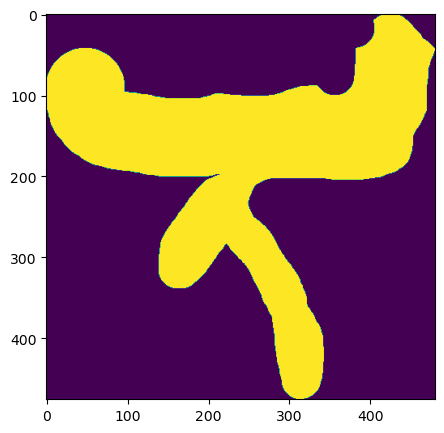

6444 4216


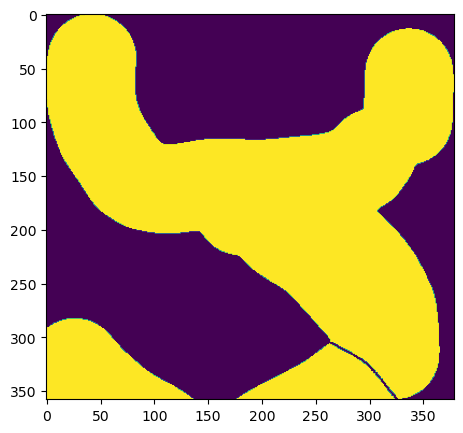

6526 1457


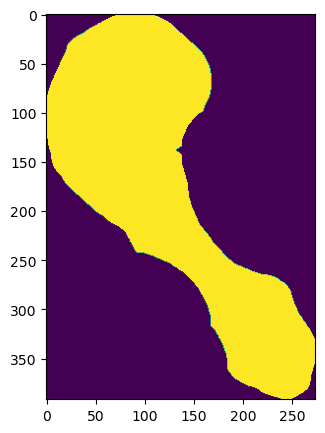

6698 2294


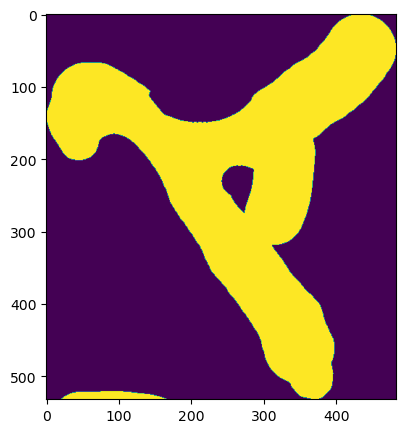

6727 3973


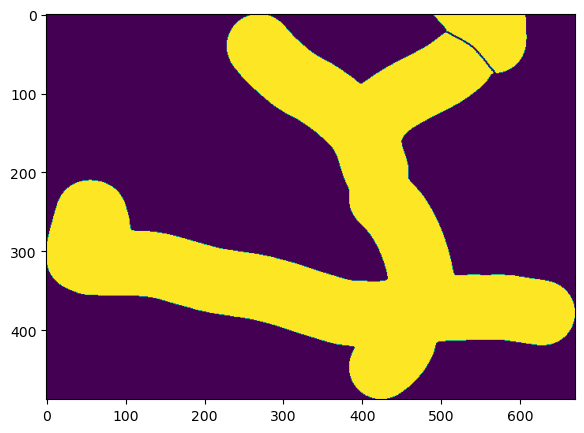

6743 3370


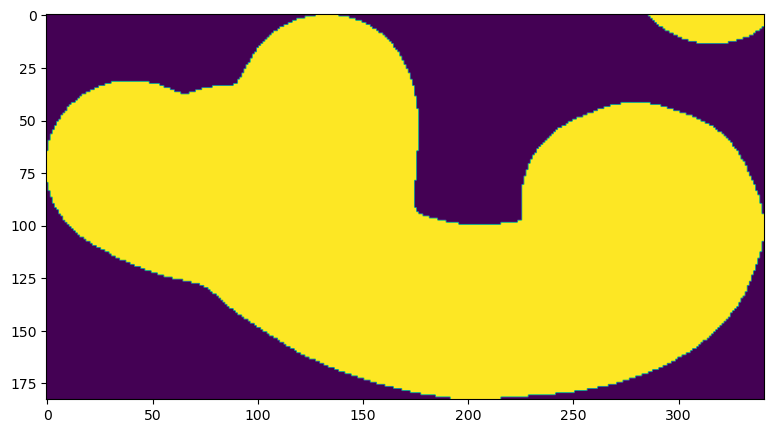

7003 3157


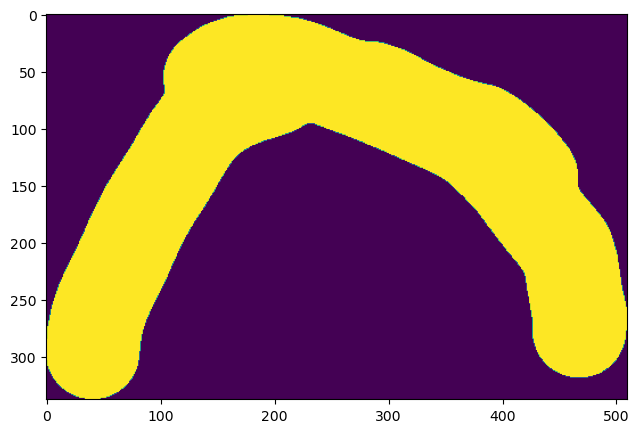

7060 513


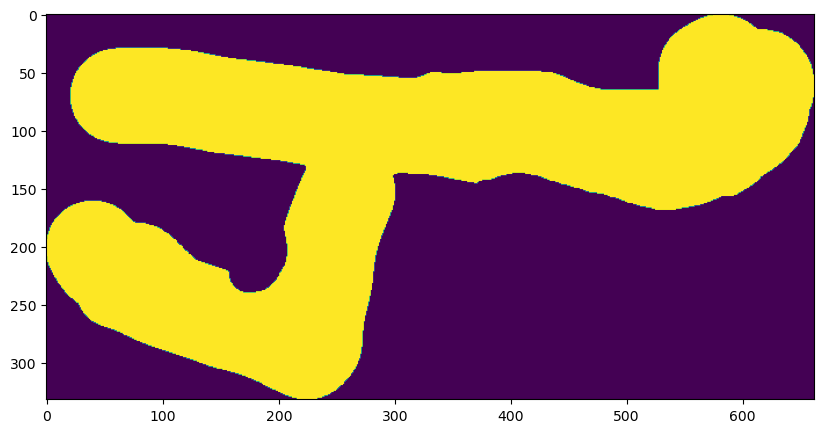

7107 1387


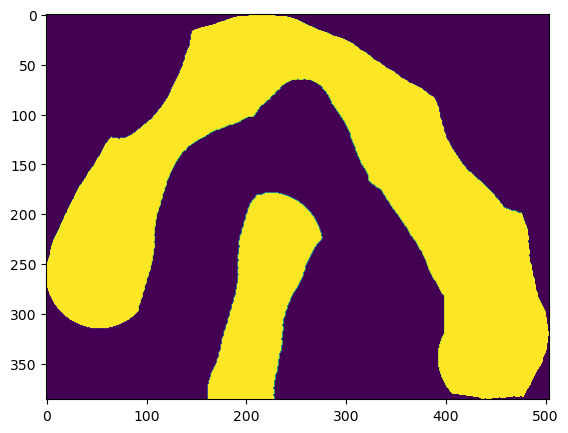

7219 2301


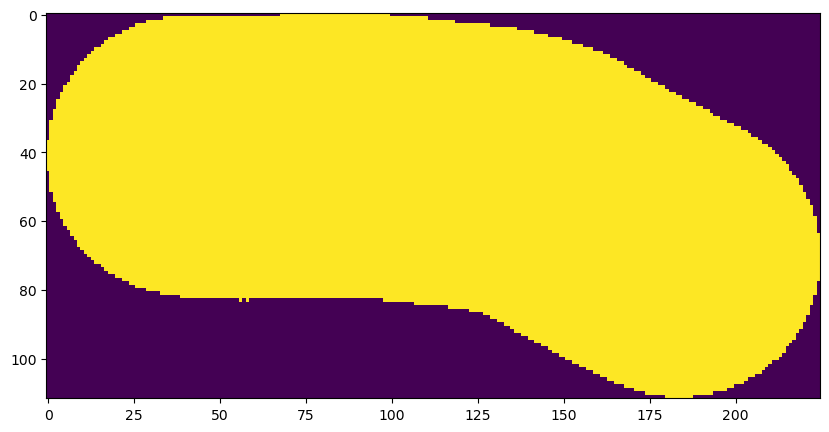

7286 1549


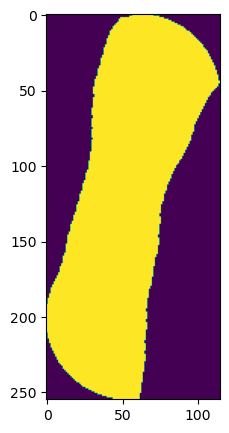

7390 4096


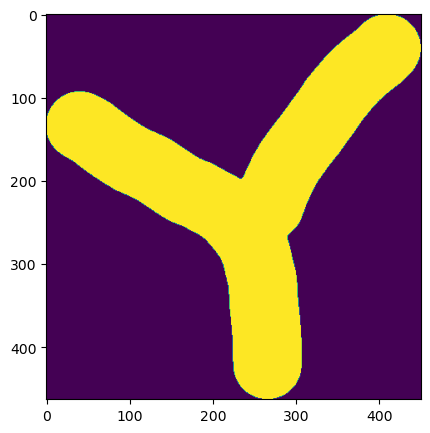

7418 3184


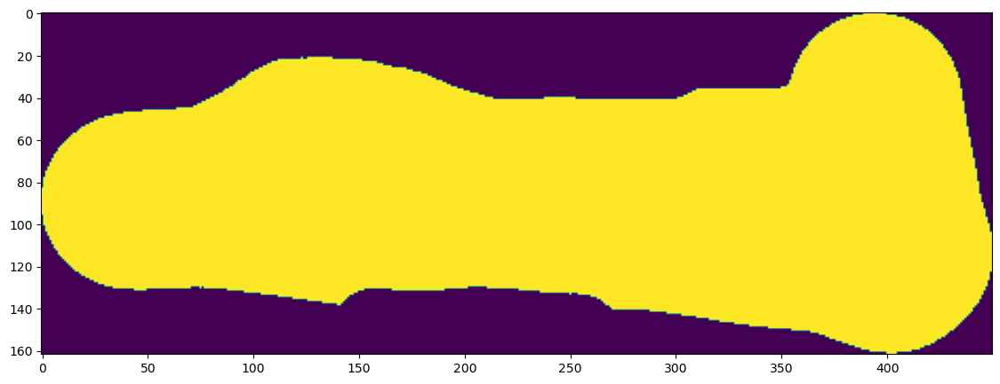

7432 477


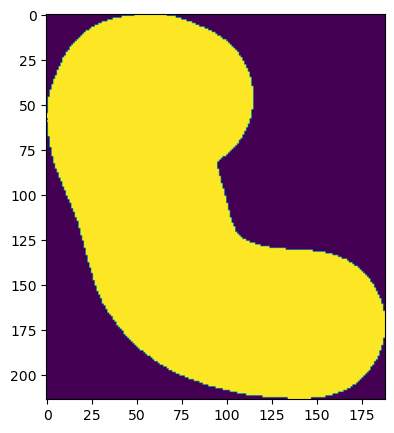

7489 2568


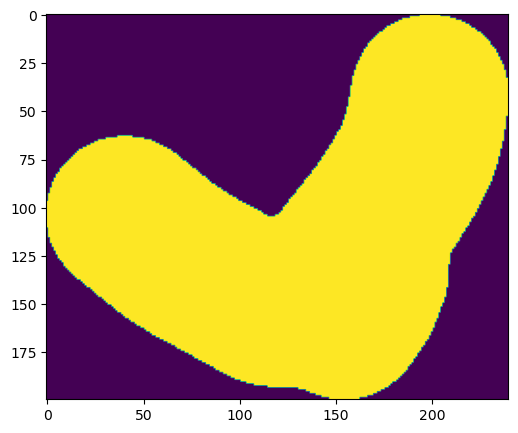

7524 676


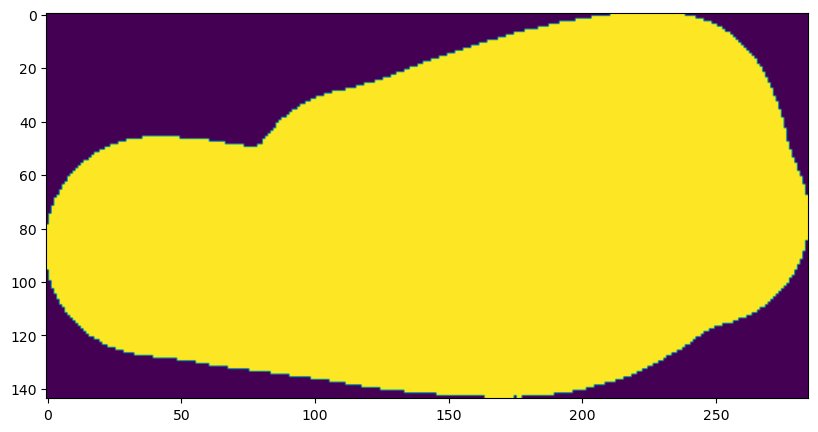

7538 2305


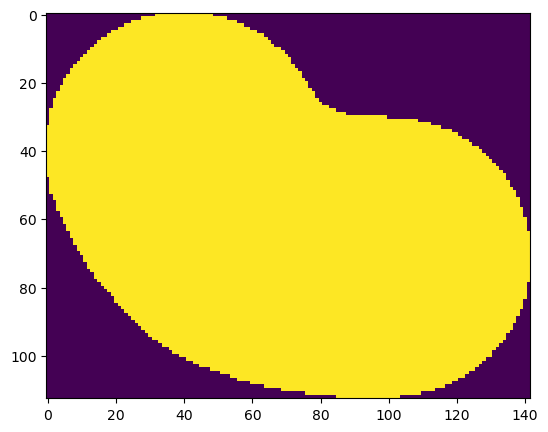

7547 1646


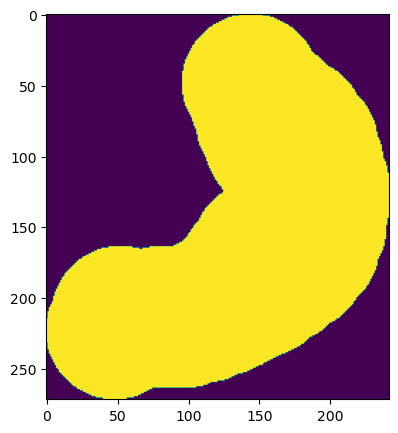

7593 1397


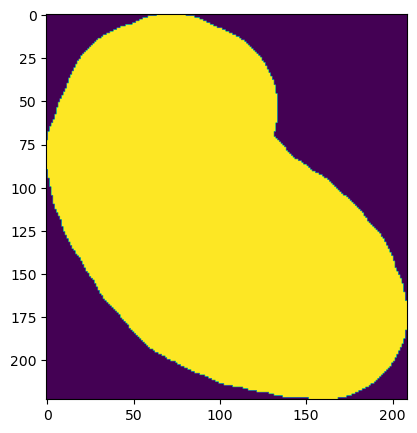

7706 2293


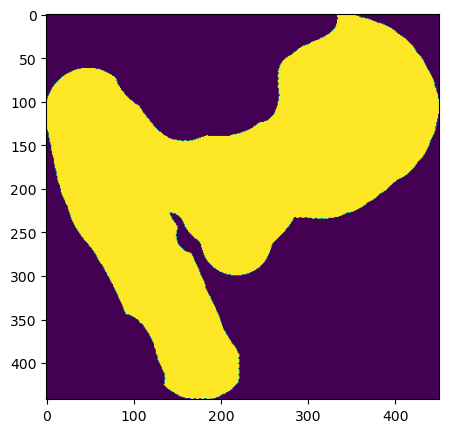

7731 494


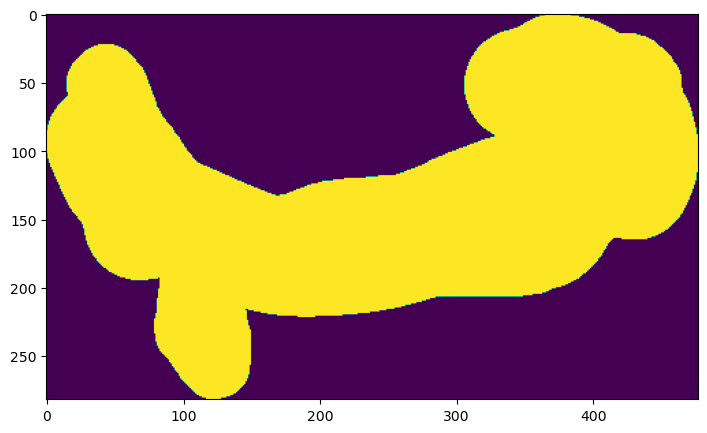

7760 3220


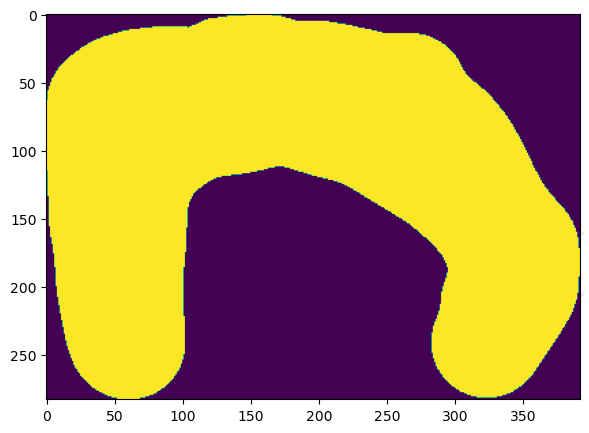

7876 1433


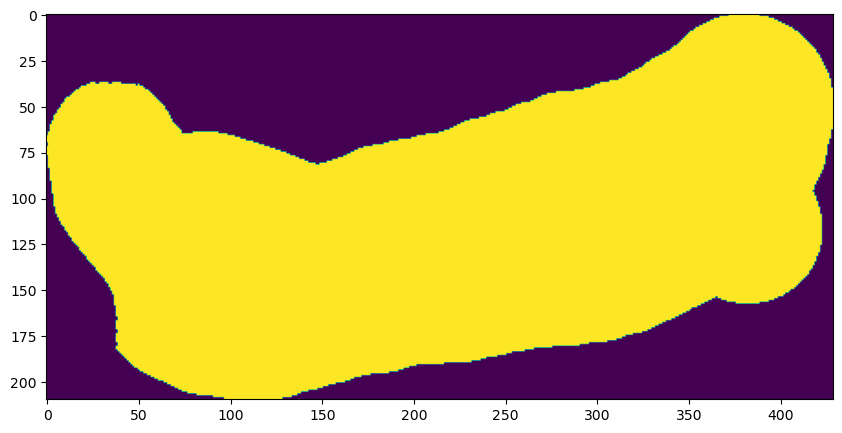

7950 4313


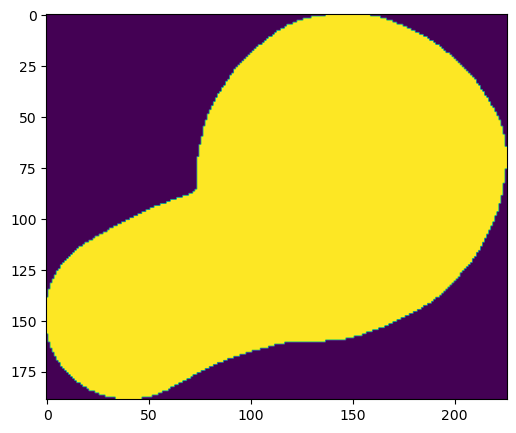

8059 4042


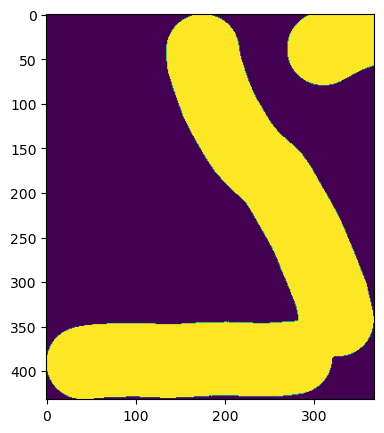

8108 1380


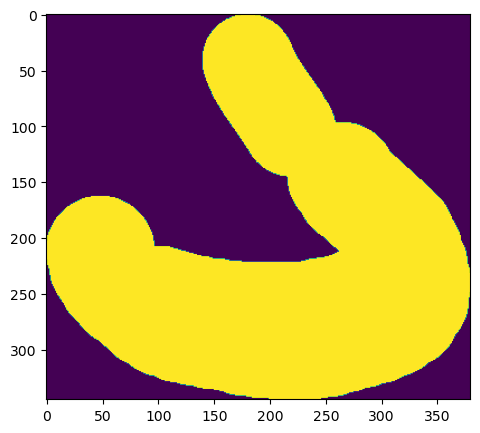

8127 3183


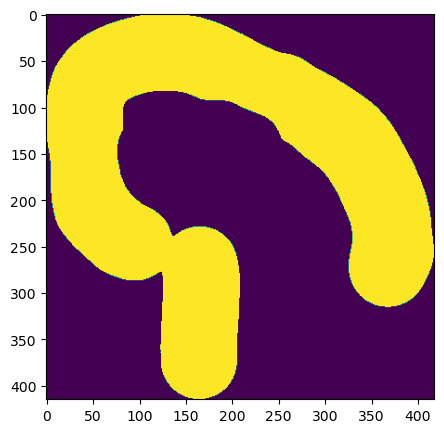

8136 474


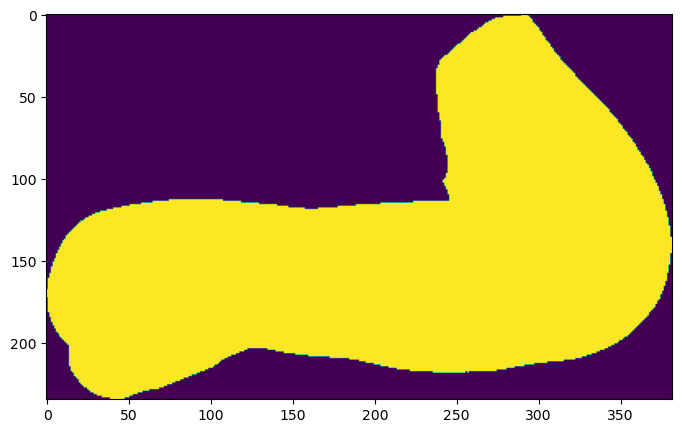

8172 2260


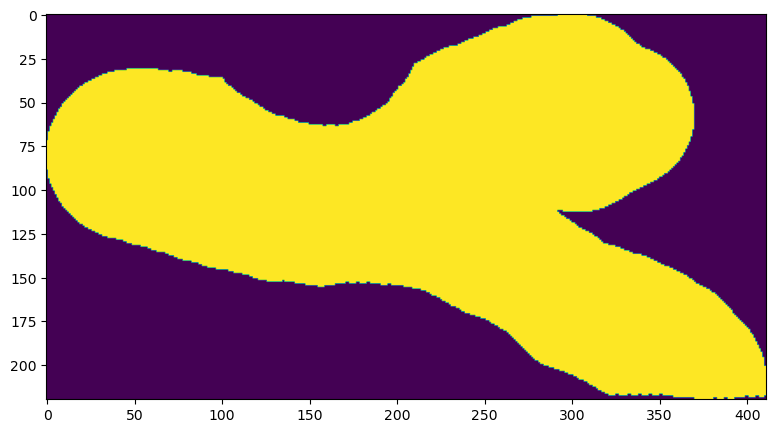

8390 423


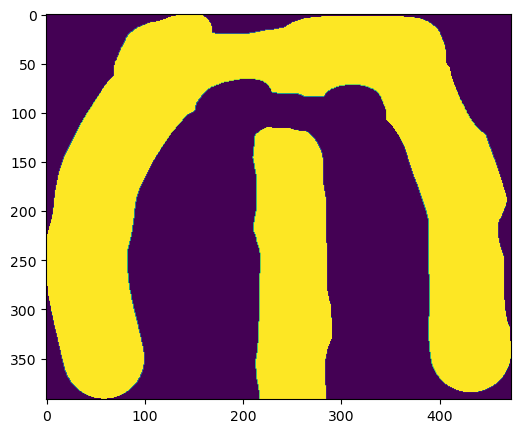

8431 2161


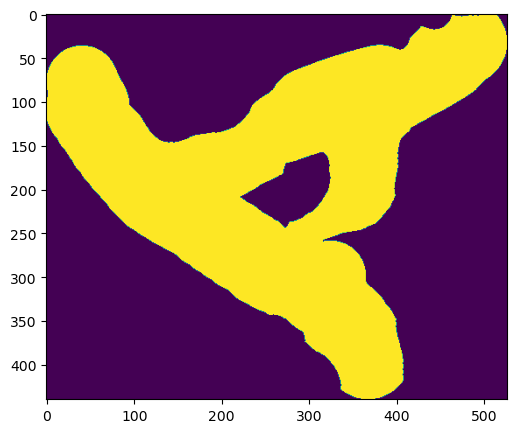

8505 633


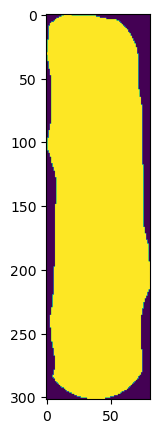

8548 3301


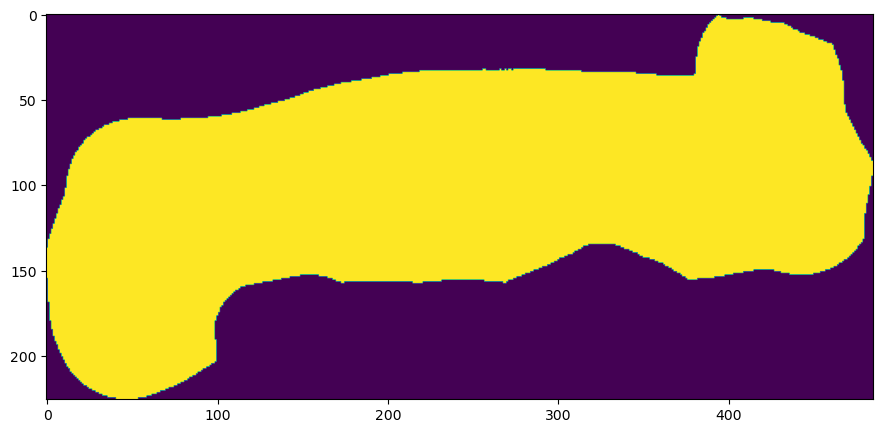

8579 3129


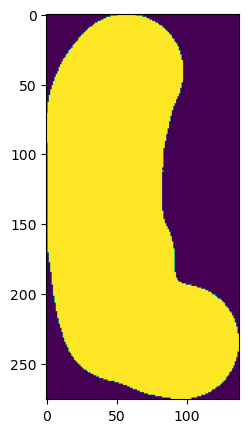

8598 1348


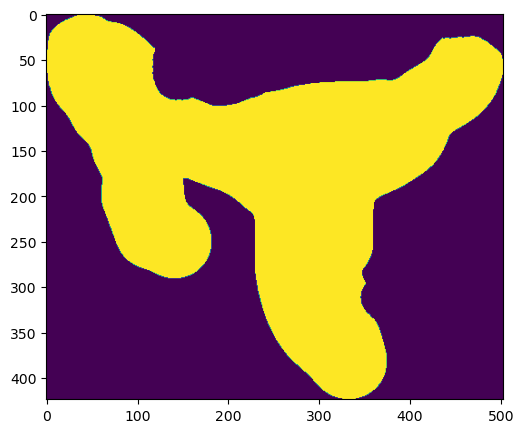

8690 4084


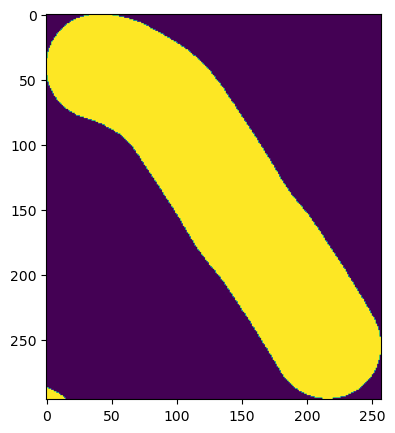

8820 4362


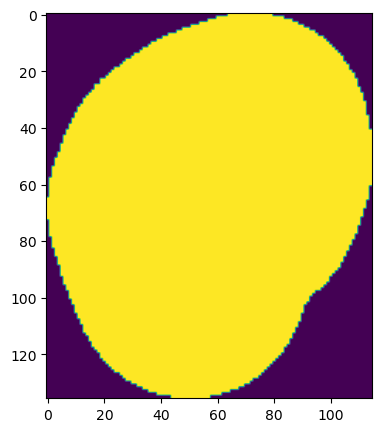

8885 2194


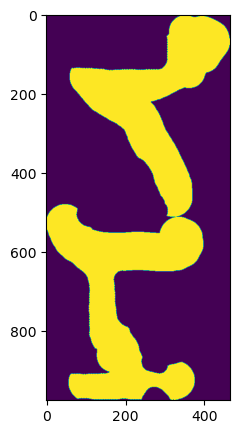

8905 445


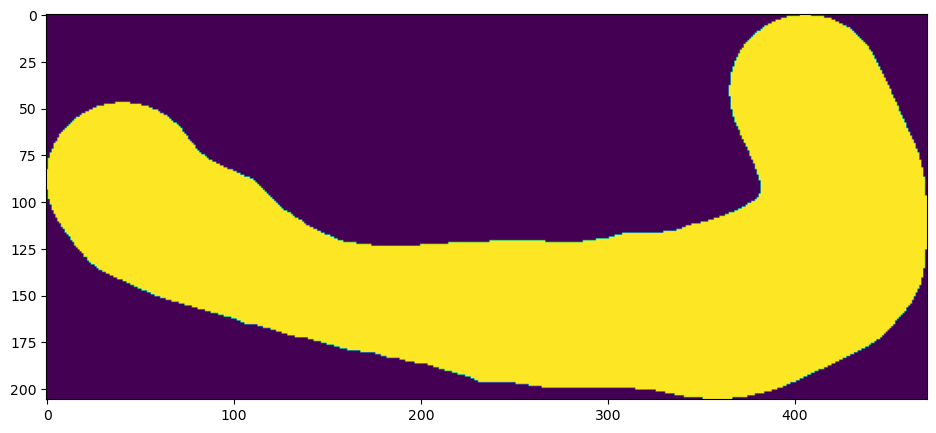

8974 4009


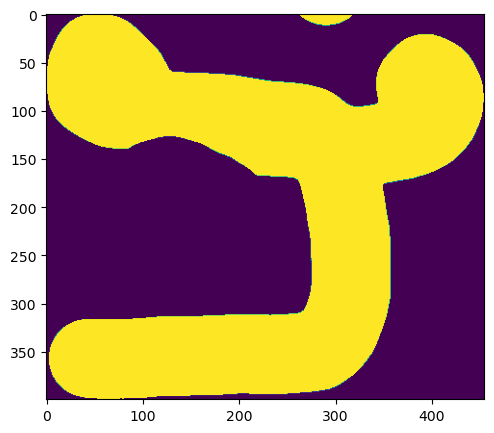

8982 3277


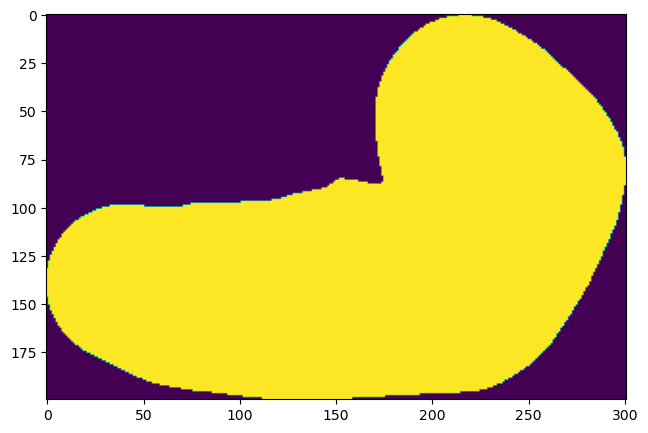

9025 3141


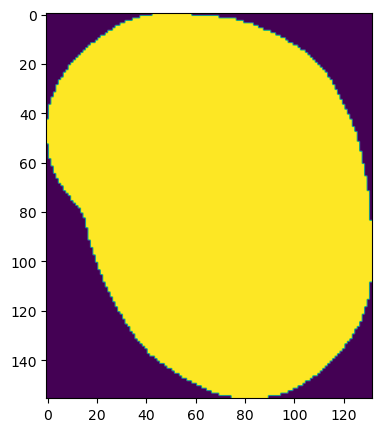

9104 1268


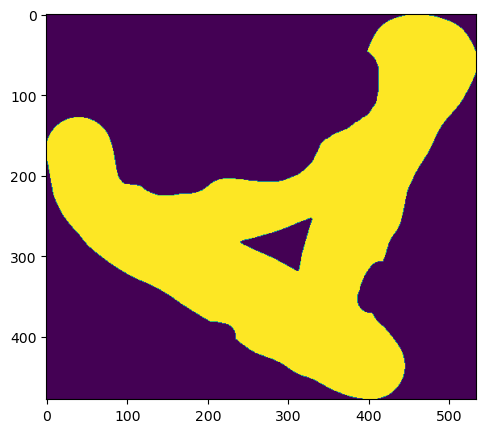

9186 455


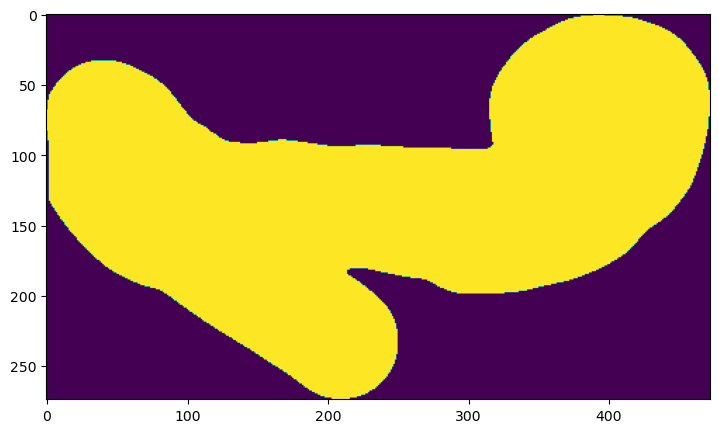

9325 3105


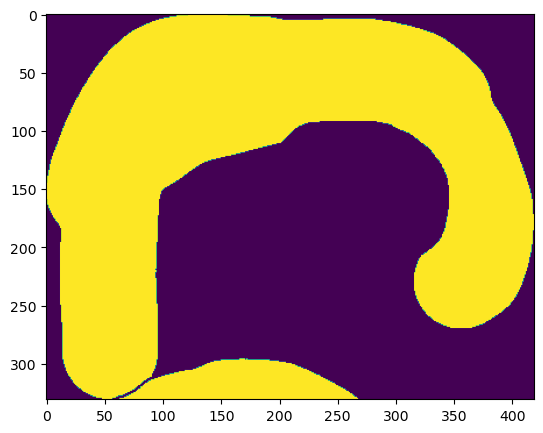

9479 3928


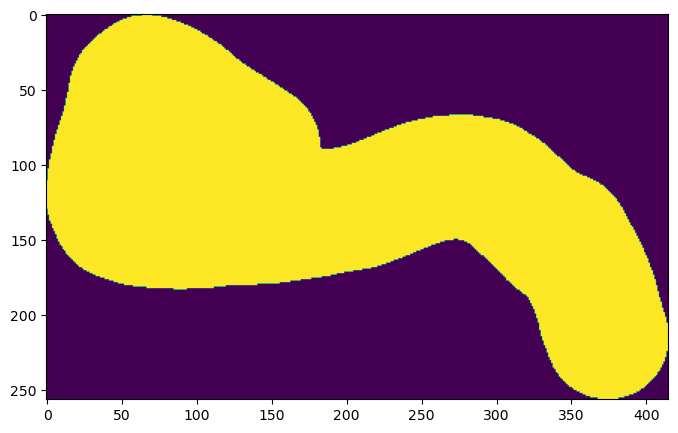

9506 457


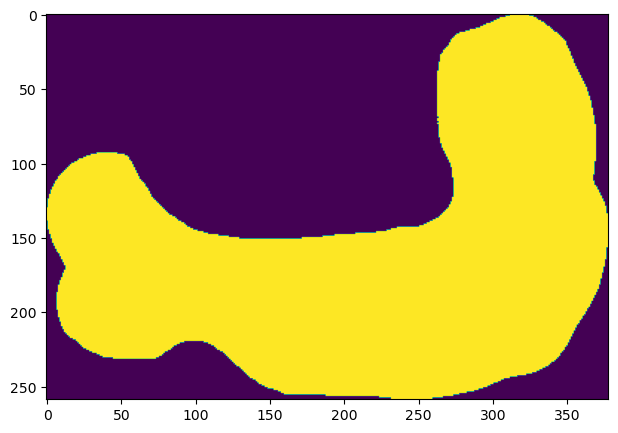

9621 3100


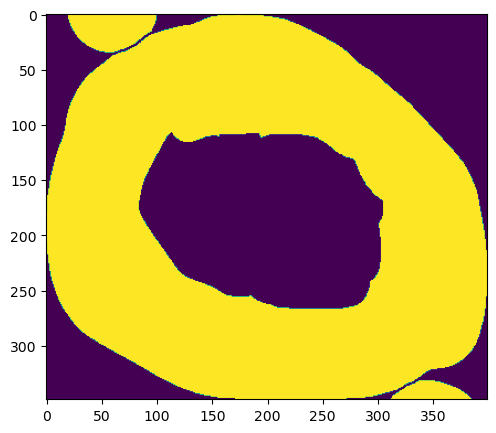

9664 1289


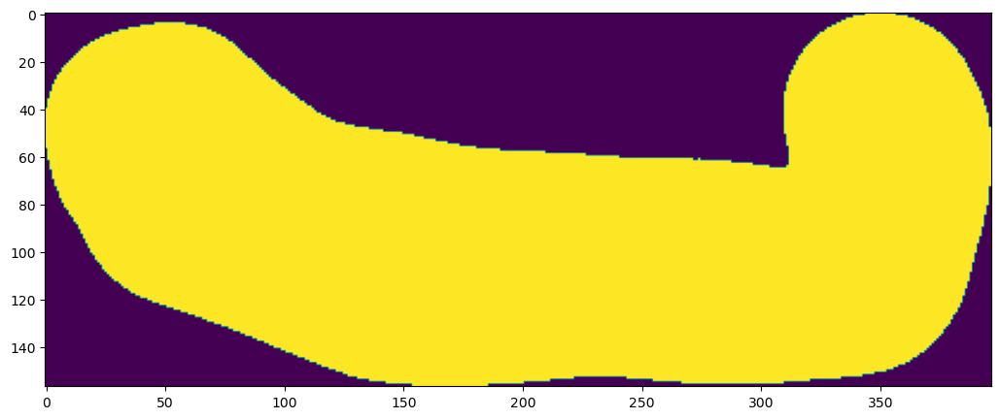

9751 4008


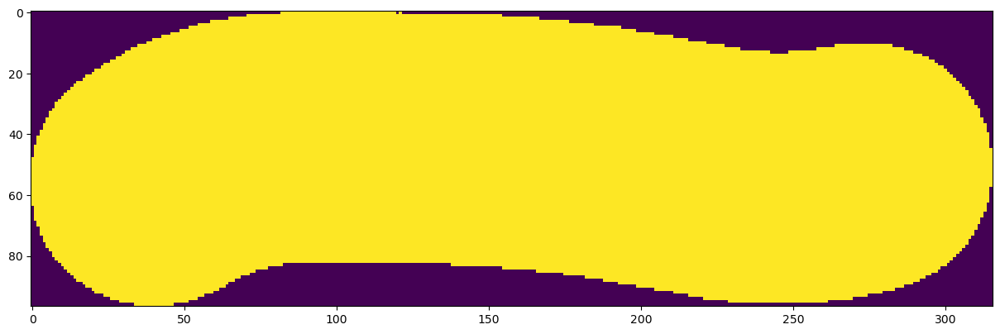

9812 454


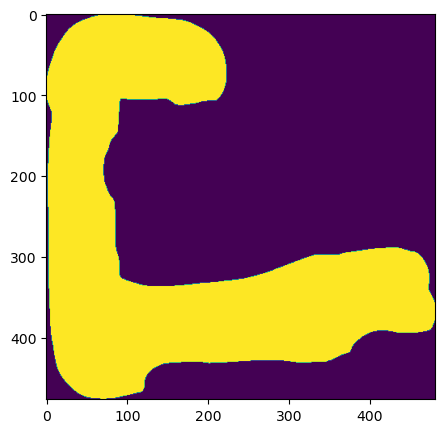

9861 2288


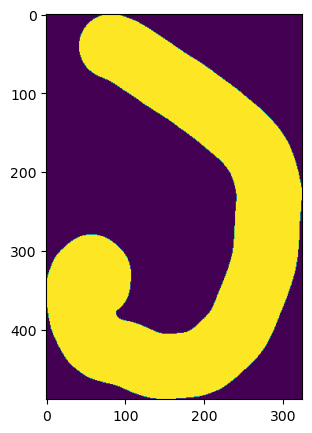

9915 1275


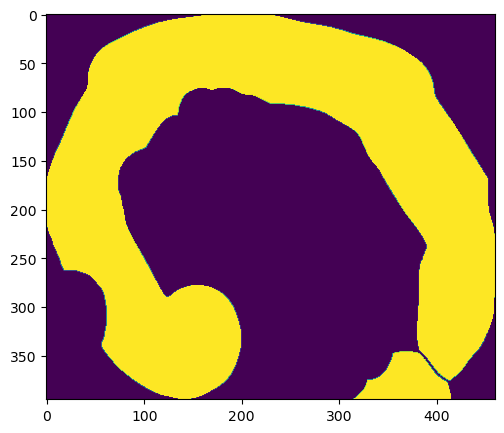

9953 3072


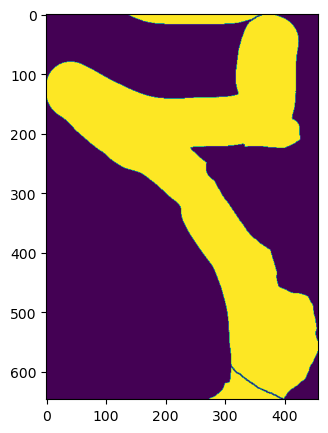

10261 1306


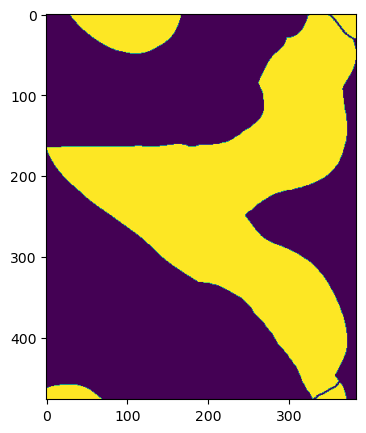

10333 385


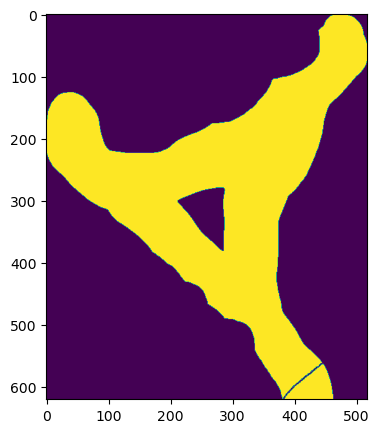

10416 2157


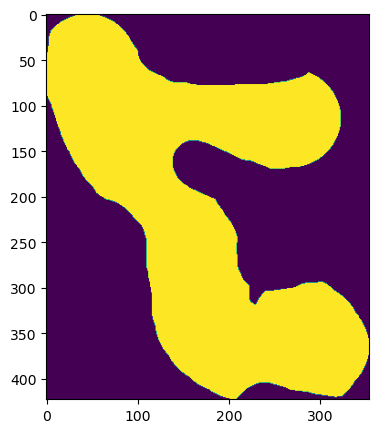

10547 3032


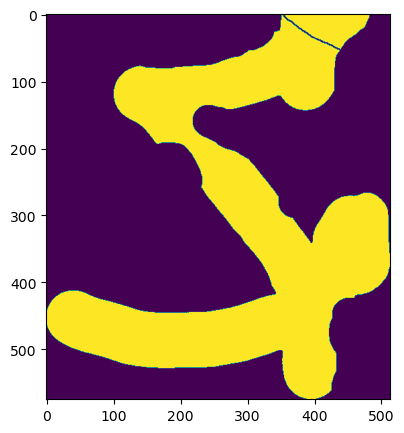

10718 1267


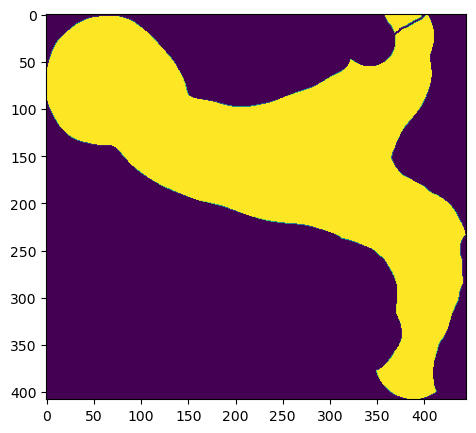

10897 359


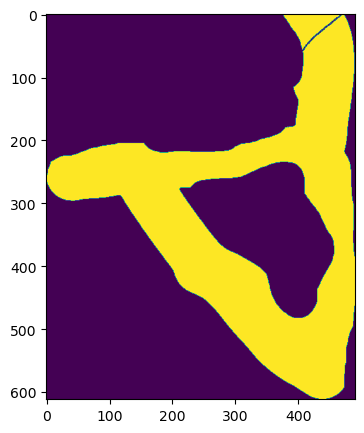

10946 2181


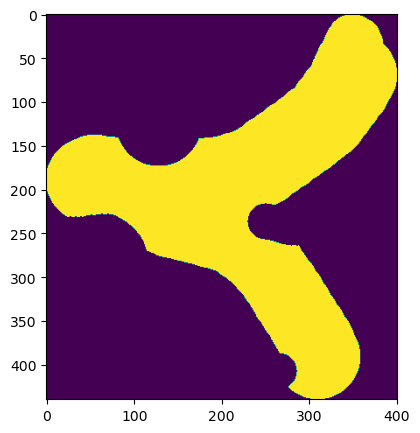

11116 1050


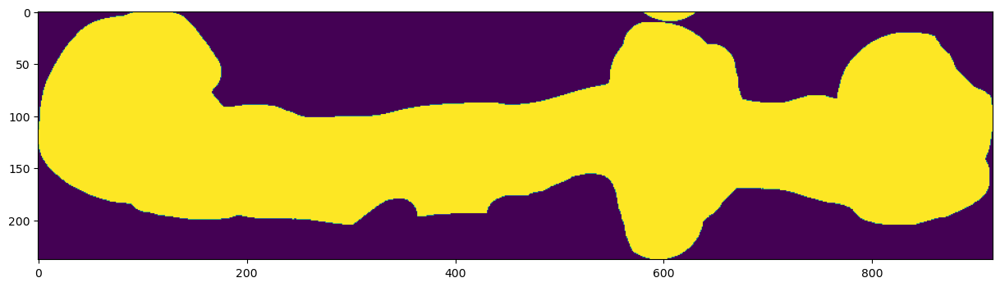

11307 3045


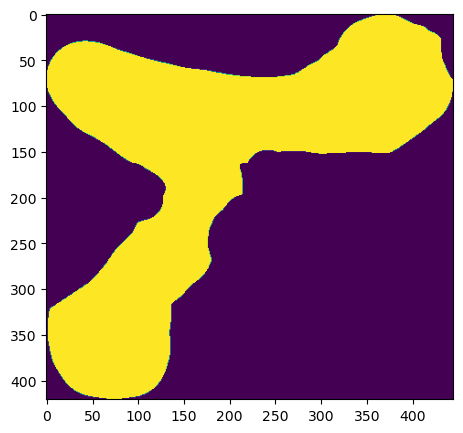

11429 1314


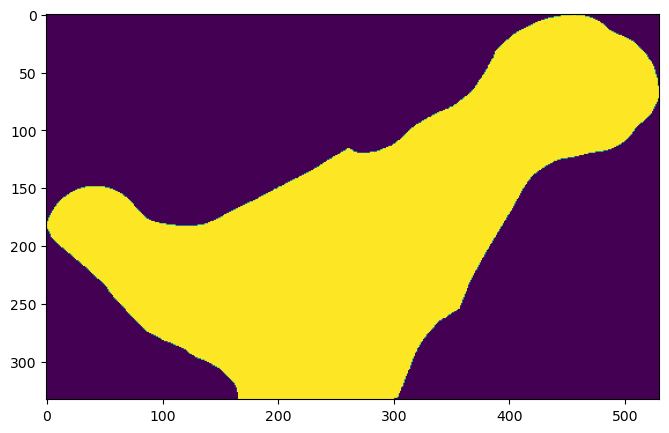

11450 2172


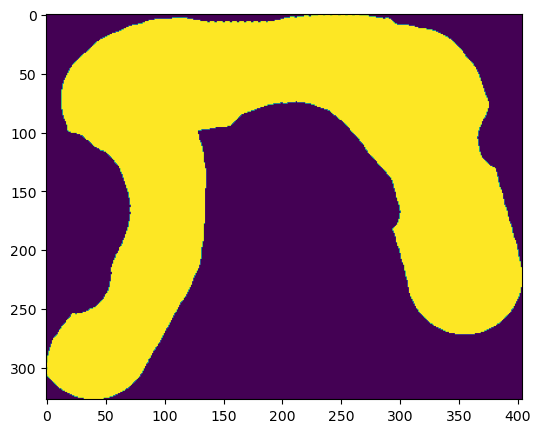

11509 482


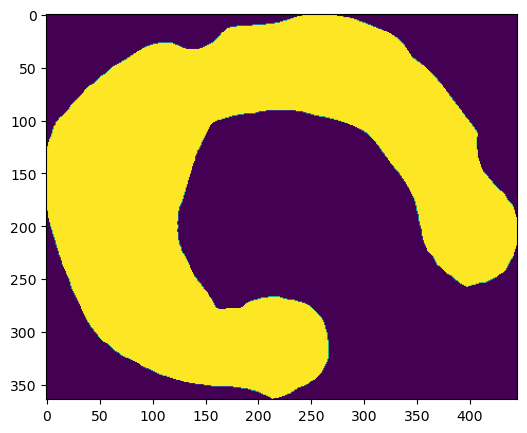

11731 3039


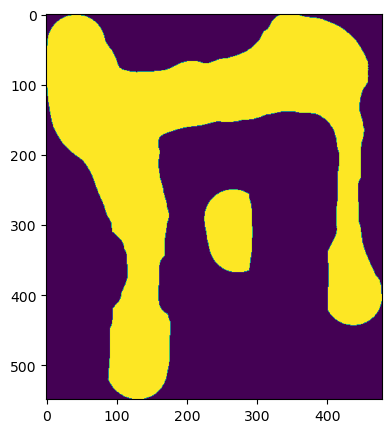

11763 1352


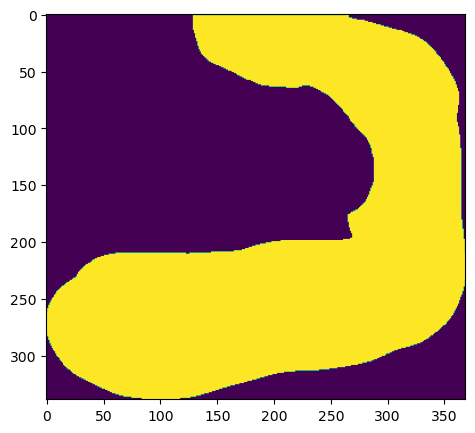

11981 3264


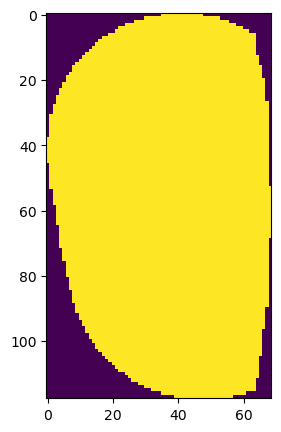

(76, 99)

In [25]:
numLabels,bbox,stats,_=cv2.connectedComponentsWithStats((mask_2d*255).astype(np.uint8),4, cv2.CV_32S)
counter_correct_size=0
for i in range(1, len(stats)):
    fig,ax=plt.subplots(ncols=1,figsize=(15,5))
    x = stats[i, cv2.CC_STAT_LEFT]
    y = stats[i, cv2.CC_STAT_TOP]
    w = stats[i, cv2.CC_STAT_WIDTH]
    h = stats[i, cv2.CC_STAT_HEIGHT]
    x2=x+w
    y2=y+h
    if w<512 and h<512:
        counter_correct_size+=1
    print(y,x)
    ax.imshow(mask_2d[y:y2,x:x2])
    # ax[1].set(xticks=np.arange(0,65))
    plt.show()
counter_correct_size,numLabels

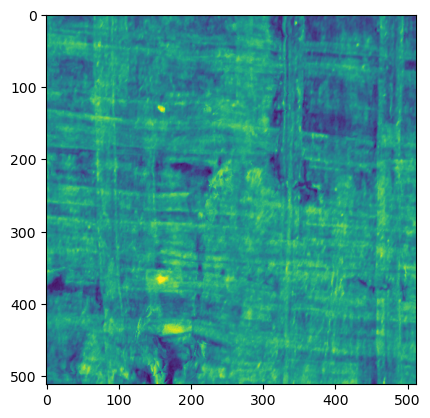

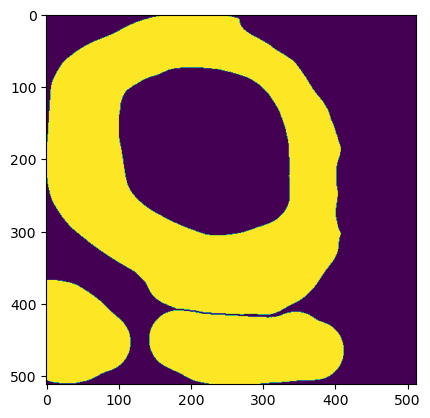

In [21]:
y=5052 
x=2452
cutout=image[y:y+512,x:x+512]
plt.imshow(np.percentile(cutout[:,:,:],85,axis=2))
plt.show()
plt.imshow(mask_2d[y:y+512,x:x+512])


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

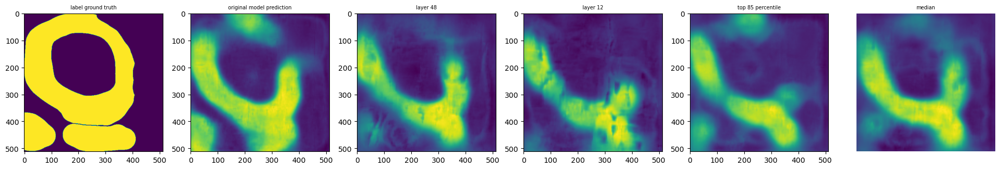

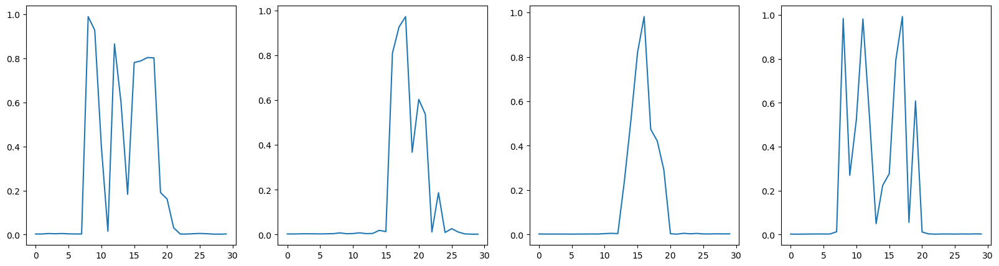

In [9]:
y1=5052
x1=2452
y2=y1+SIZE
x2=x1+SIZE
LR=2e-1
BETA=1.5
# image,fragment_mask,mask_2d = read_image_mask('20231210121321',12,50,0)

fig,ax=plt.subplots(1,6,figsize=(24,4))
data=t(image=image[y1:y2,x1:x2,3:33])['image'].unsqueeze(0).to(device)
noise=t2(image=image[y1:y2,x1:x2,36])['image'].unsqueeze(0).unsqueeze(0)
noise2=t2(image=image[y1:y2,x1:x2,0])['image'].unsqueeze(0).unsqueeze(0).repeat(1,1,30,1,1).to(device)
noise3=t2(image=np.percentile(image[y1:y2,x1:x2,:],85,axis=2))['image'].unsqueeze(0).unsqueeze(0).repeat(1,1,30,1,1).to(device)
noise4=t2(image=np.median(image[y1:y2,x1:x2,:],axis=2))['image'].unsqueeze(0).unsqueeze(0).repeat(1,1,30,1,1).to(device)

noise=noise.repeat(1,1,30,1,1).to(device)
ax[0].imshow(mask_2d[y1:y2,x1:x2])
ax[0].set_title('label ground truth', fontsize=7)
ax[1].imshow(F.interpolate( model(data)[0].unsqueeze(0).float(),scale_factor=4,mode='bilinear').squeeze(0).squeeze(0).detach().cpu().numpy())
ax[1].set_title('original model prediction', fontsize=7)

# using layer number 48 for noise
gates,gates_history,final_pred=attribute_z(data,noise,model,loss_func,N_STEPS,LR,BETA,SIZE)

# using layer number 12 for noise
gates2,gates_history2,final_pred2=attribute_z(data,noise2,model,loss_func,N_STEPS,LR,BETA,SIZE)

 # using the top 85 percentile of all the layers for noise
gates3,gates_history3,final_pred3=attribute_z(data,noise3,model,loss_func,N_STEPS,LR,BETA,SIZE)

 # using the median of the layers for noise
gates4,gates_history4,final_pred4=attribute_z(data,noise4,model,loss_func,N_STEPS,LR,BETA,SIZE)

ax[2].set_title('layer 48', fontsize=7)
ax[2].imshow(F.interpolate(torch.Tensor(final_pred)[0].unsqueeze(0).float(),scale_factor=4,mode='bilinear').squeeze(0).squeeze(0).cpu().numpy())
ax[3].set_title('layer 12', fontsize=7)
ax[3].imshow(F.interpolate(torch.Tensor(final_pred2)[0].unsqueeze(0).float(),scale_factor=4,mode='bilinear').squeeze(0).squeeze(0).cpu().numpy())
ax[4].set_title('top 85 percentile', fontsize=7)
ax[4].imshow(F.interpolate(torch.Tensor(final_pred3)[0].unsqueeze(0).float(),scale_factor=4,mode='bilinear').squeeze(0).squeeze(0).cpu().numpy())
ax[5].set_title('median', fontsize=7)
ax[5].imshow(F.interpolate(torch.Tensor(final_pred4)[0].unsqueeze(0).float(),scale_factor=4,mode='bilinear').squeeze(0).squeeze(0).cpu().numpy())

plt.axis('off')
plt.show()


fig,ax=plt.subplots(1,4,figsize=(20,5))
ax[0].plot(gates.reshape(-1))
ax[1].plot(gates2.reshape(-1))
ax[2].plot(gates3.reshape(-1))
ax[3].plot(gates4.reshape(-1))
plt.show()


# 3d Volumetric Labels generation
We now know the shape of the letter in x-y, and where it lies in z. We can use the attribution to propagate our labels/predictions to the 3d volumes and localize the letters in 3d to fully unlock the 3d ink detection approaches. 

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

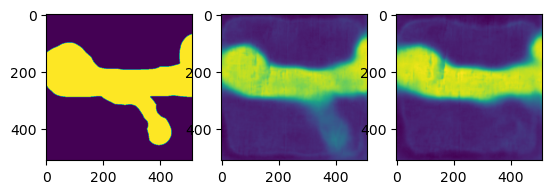

  0%|          | 0/100 [00:00<?, ?it/s]

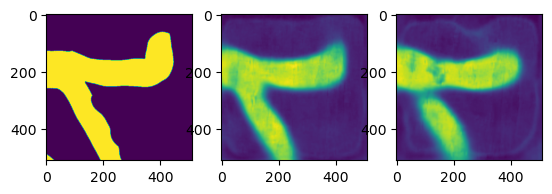

  0%|          | 0/100 [00:00<?, ?it/s]

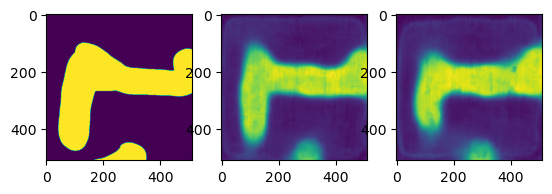

  0%|          | 0/100 [00:00<?, ?it/s]

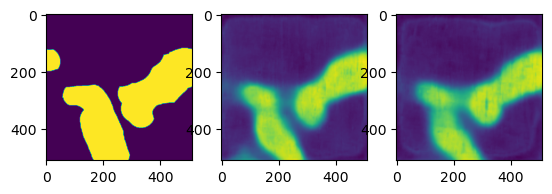

  0%|          | 0/100 [00:00<?, ?it/s]

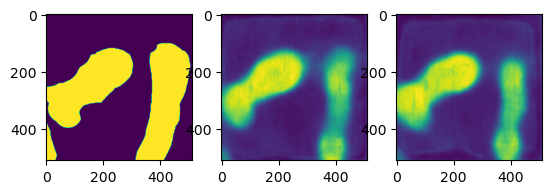

  0%|          | 0/100 [00:00<?, ?it/s]

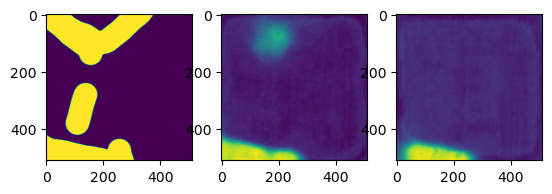

  0%|          | 0/100 [00:00<?, ?it/s]

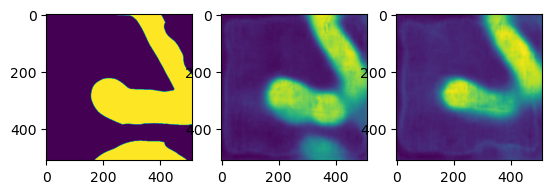

  0%|          | 0/100 [00:00<?, ?it/s]

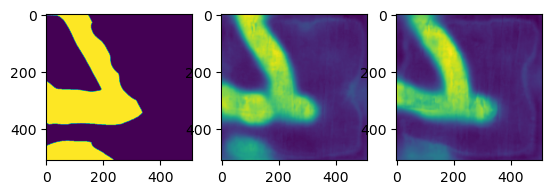

  0%|          | 0/100 [00:00<?, ?it/s]

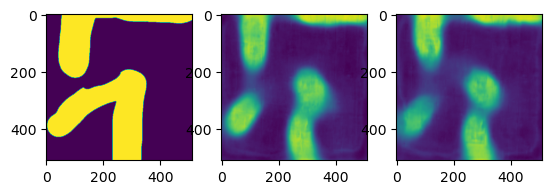

  0%|          | 0/100 [00:00<?, ?it/s]

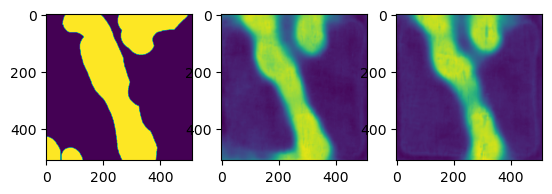

  0%|          | 0/100 [00:00<?, ?it/s]

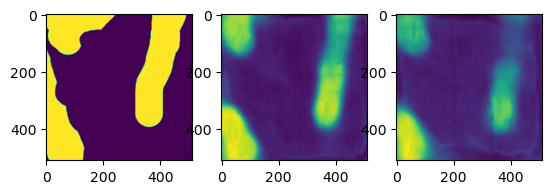

  0%|          | 0/100 [00:00<?, ?it/s]

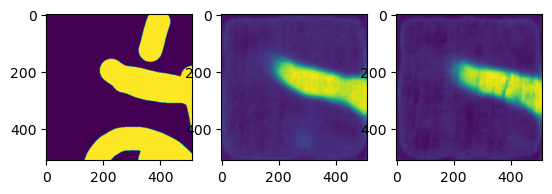

  0%|          | 0/100 [00:00<?, ?it/s]

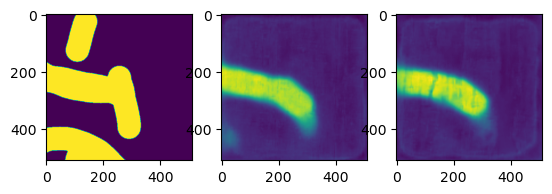

  0%|          | 0/100 [00:00<?, ?it/s]

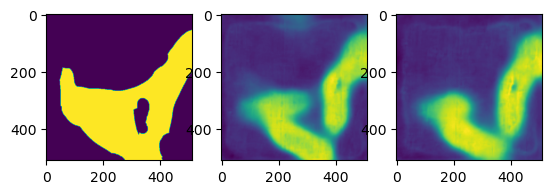

  0%|          | 0/100 [00:00<?, ?it/s]

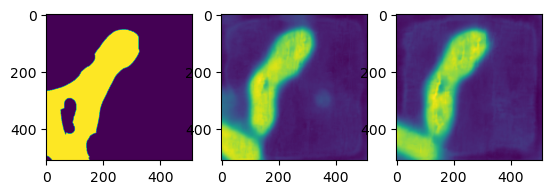

  0%|          | 0/100 [00:00<?, ?it/s]

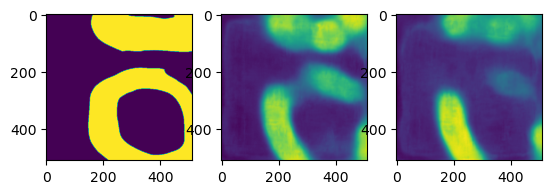

  0%|          | 0/100 [00:00<?, ?it/s]

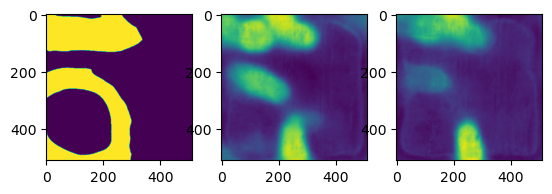

  0%|          | 0/100 [00:00<?, ?it/s]

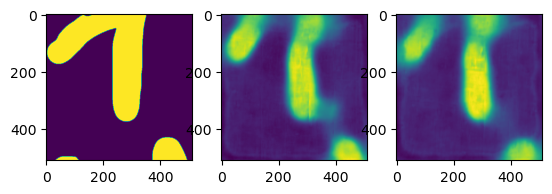

  0%|          | 0/100 [00:00<?, ?it/s]

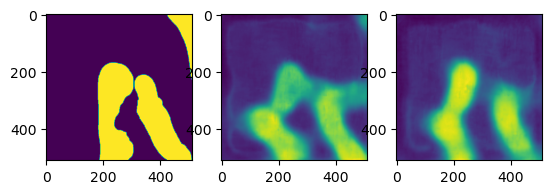

  0%|          | 0/100 [00:00<?, ?it/s]

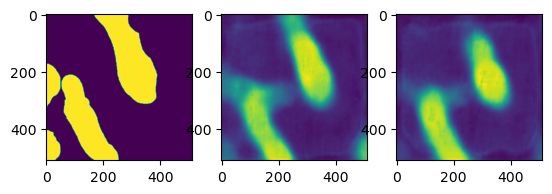

  0%|          | 0/100 [00:00<?, ?it/s]

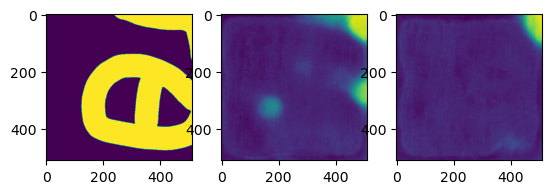

  0%|          | 0/100 [00:00<?, ?it/s]

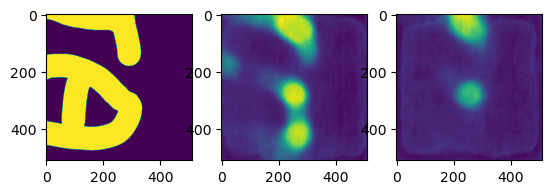

  0%|          | 0/100 [00:00<?, ?it/s]

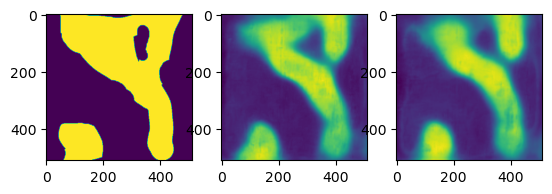

  0%|          | 0/100 [00:00<?, ?it/s]

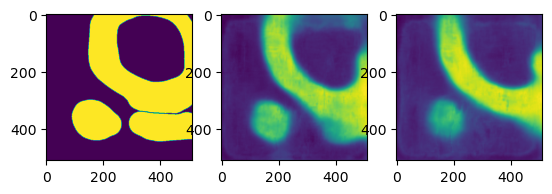

  0%|          | 0/100 [00:00<?, ?it/s]

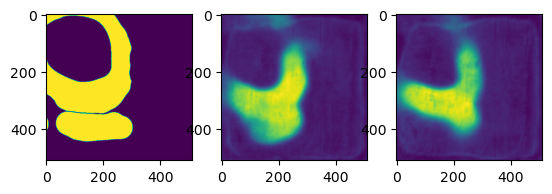

  0%|          | 0/100 [00:00<?, ?it/s]

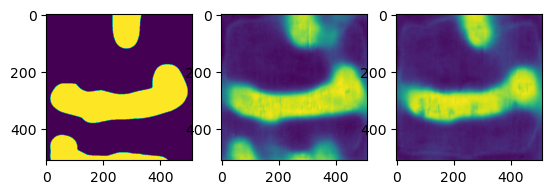

  0%|          | 0/100 [00:00<?, ?it/s]

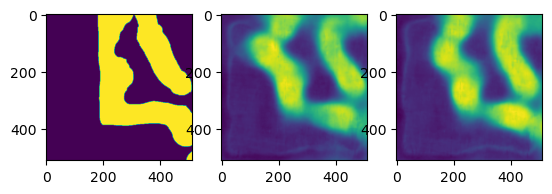

  0%|          | 0/100 [00:00<?, ?it/s]

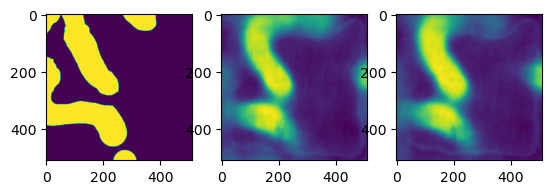

  0%|          | 0/100 [00:00<?, ?it/s]

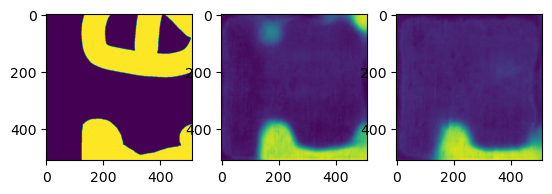

  0%|          | 0/100 [00:00<?, ?it/s]

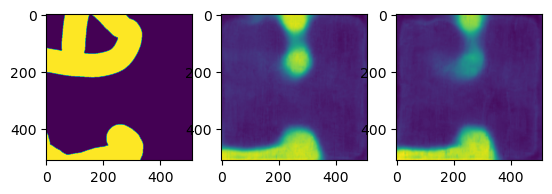

  0%|          | 0/100 [00:00<?, ?it/s]

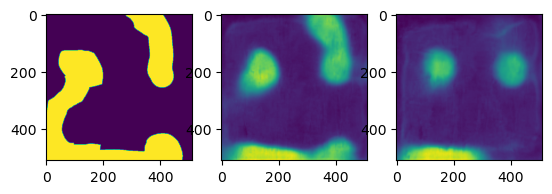

  0%|          | 0/100 [00:00<?, ?it/s]

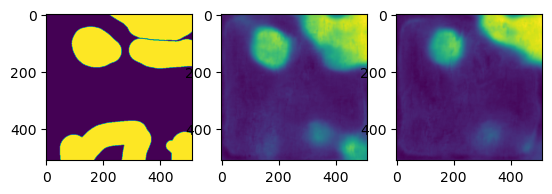

  0%|          | 0/100 [00:00<?, ?it/s]

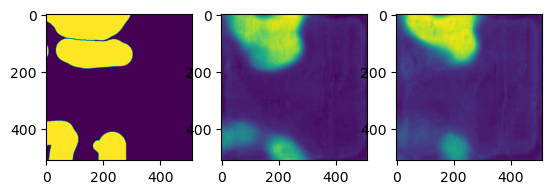

  0%|          | 0/100 [00:00<?, ?it/s]

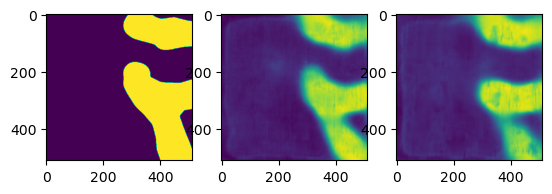

  0%|          | 0/100 [00:00<?, ?it/s]

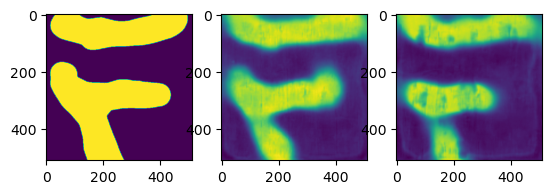

  0%|          | 0/100 [00:00<?, ?it/s]

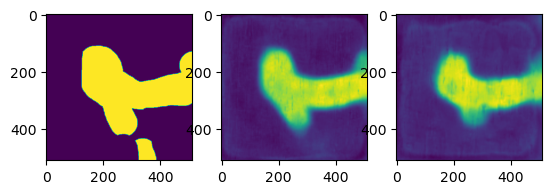

  0%|          | 0/100 [00:00<?, ?it/s]

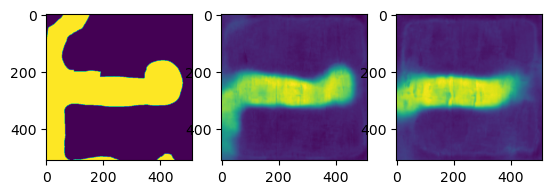

  0%|          | 0/100 [00:00<?, ?it/s]

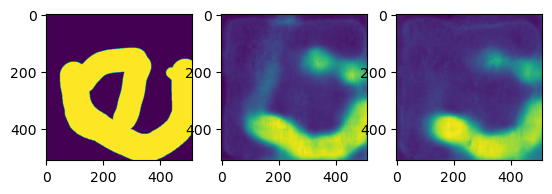

  0%|          | 0/100 [00:00<?, ?it/s]

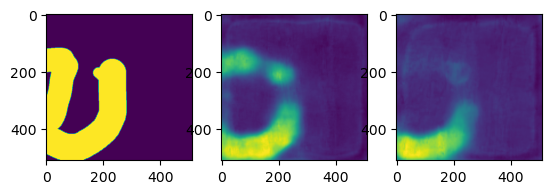

  0%|          | 0/100 [00:00<?, ?it/s]

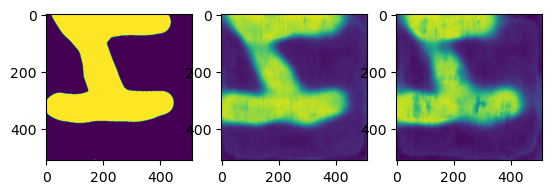

  0%|          | 0/100 [00:00<?, ?it/s]

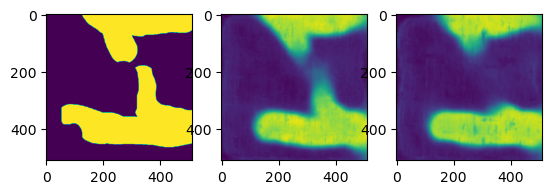

  0%|          | 0/100 [00:00<?, ?it/s]

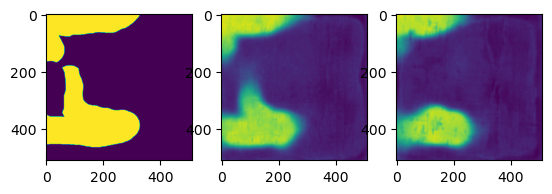

  0%|          | 0/100 [00:00<?, ?it/s]

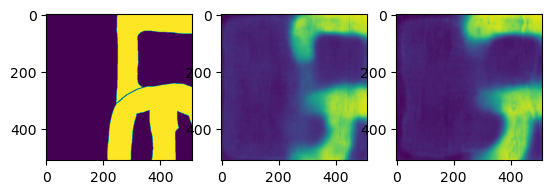

  0%|          | 0/100 [00:00<?, ?it/s]

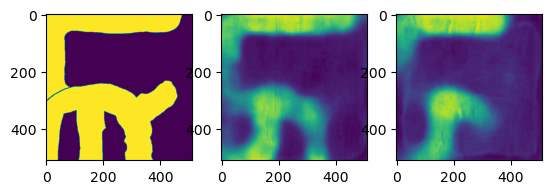

  0%|          | 0/100 [00:00<?, ?it/s]

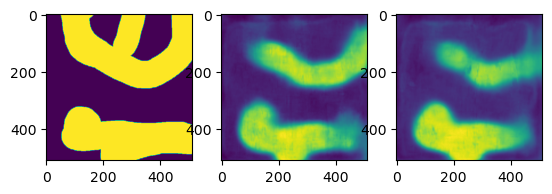

  0%|          | 0/100 [00:00<?, ?it/s]

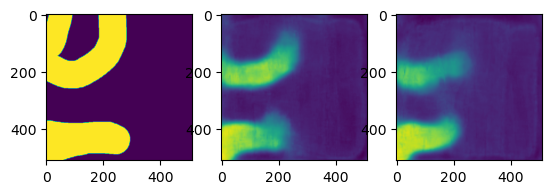

  0%|          | 0/100 [00:00<?, ?it/s]

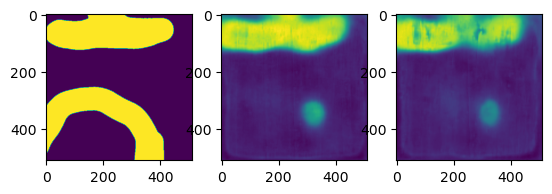

  0%|          | 0/100 [00:00<?, ?it/s]

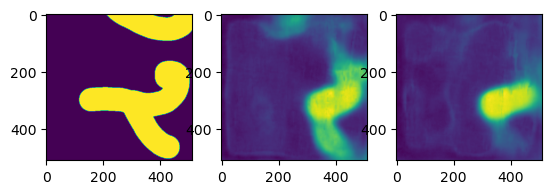

  0%|          | 0/100 [00:00<?, ?it/s]

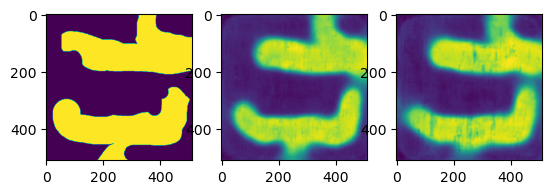

  0%|          | 0/100 [00:00<?, ?it/s]

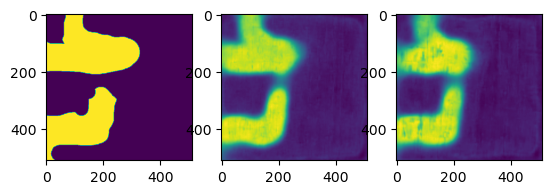

  0%|          | 0/100 [00:00<?, ?it/s]

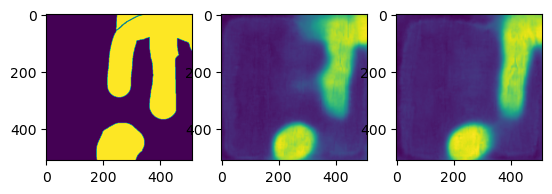

  0%|          | 0/100 [00:00<?, ?it/s]

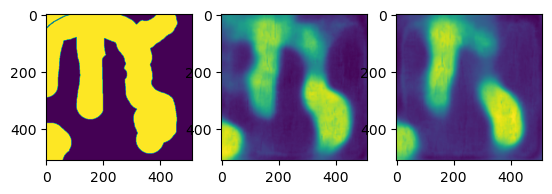

  0%|          | 0/100 [00:00<?, ?it/s]

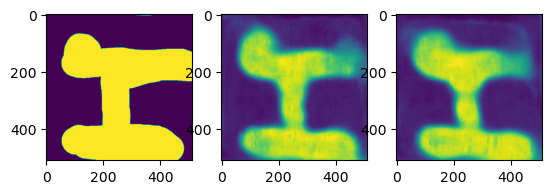

  0%|          | 0/100 [00:00<?, ?it/s]

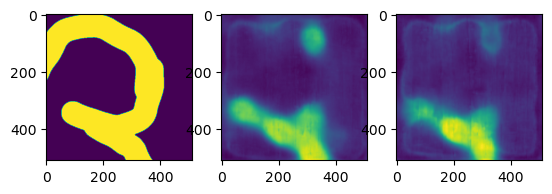

  0%|          | 0/100 [00:00<?, ?it/s]

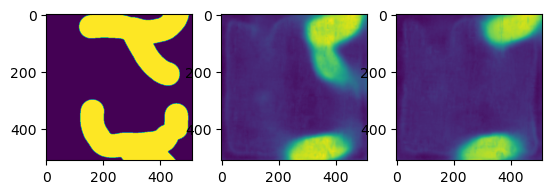

  0%|          | 0/100 [00:00<?, ?it/s]

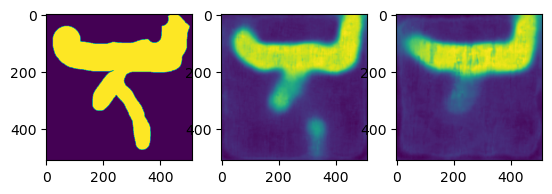

  0%|          | 0/100 [00:00<?, ?it/s]

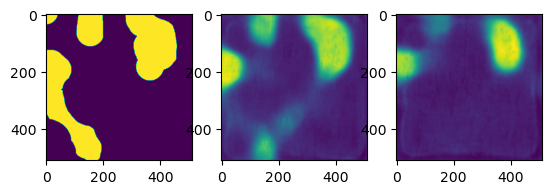

  0%|          | 0/100 [00:00<?, ?it/s]

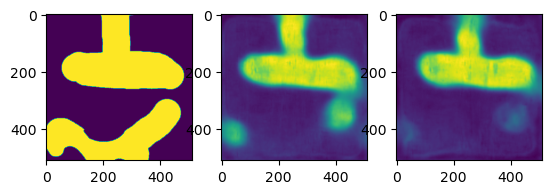

  0%|          | 0/100 [00:00<?, ?it/s]

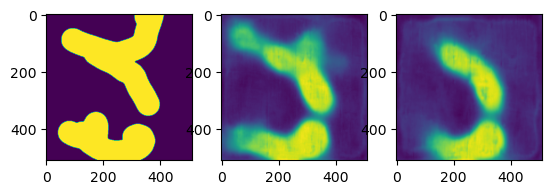

  0%|          | 0/100 [00:00<?, ?it/s]

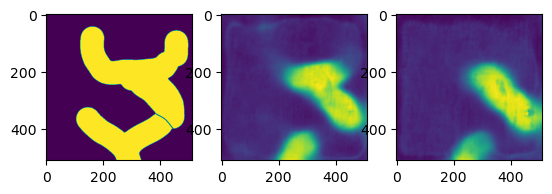

  0%|          | 0/100 [00:00<?, ?it/s]

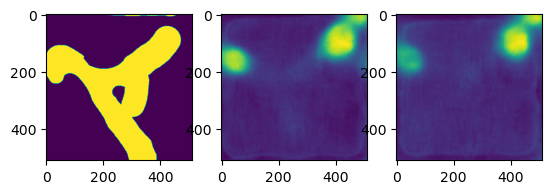

  0%|          | 0/100 [00:00<?, ?it/s]

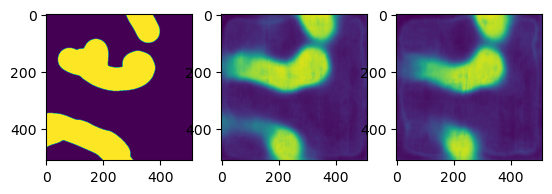

  0%|          | 0/100 [00:00<?, ?it/s]

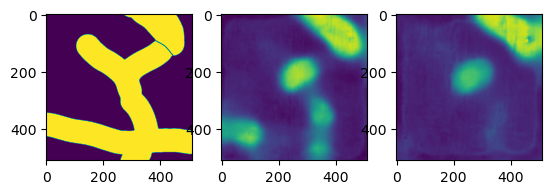

  0%|          | 0/100 [00:00<?, ?it/s]

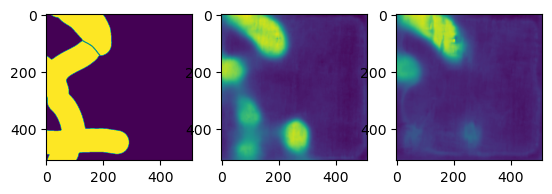

  0%|          | 0/100 [00:00<?, ?it/s]

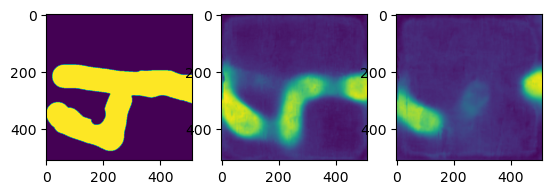

  0%|          | 0/100 [00:00<?, ?it/s]

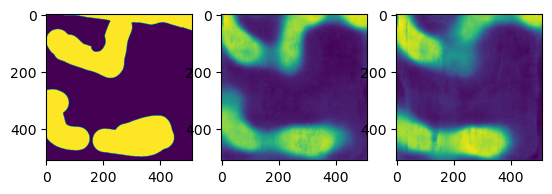

  0%|          | 0/100 [00:00<?, ?it/s]

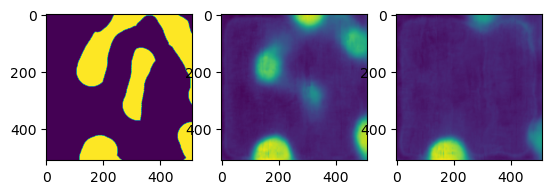

  0%|          | 0/100 [00:00<?, ?it/s]

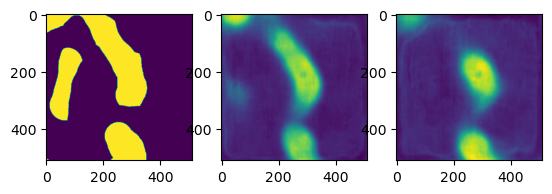

  0%|          | 0/100 [00:00<?, ?it/s]

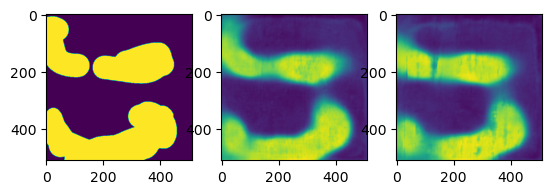

  0%|          | 0/100 [00:00<?, ?it/s]

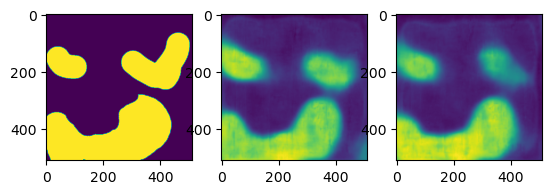

  0%|          | 0/100 [00:00<?, ?it/s]

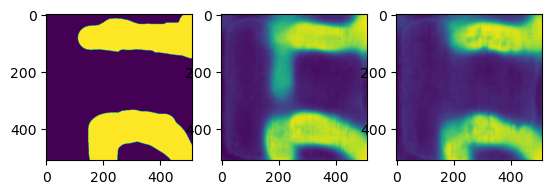

  0%|          | 0/100 [00:00<?, ?it/s]

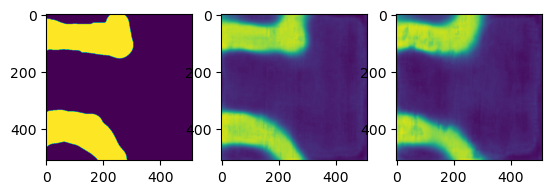

  0%|          | 0/100 [00:00<?, ?it/s]

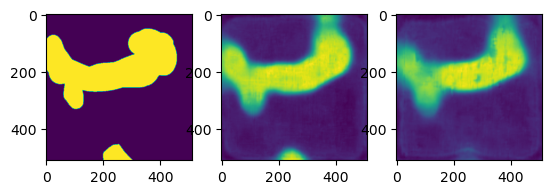

  0%|          | 0/100 [00:00<?, ?it/s]

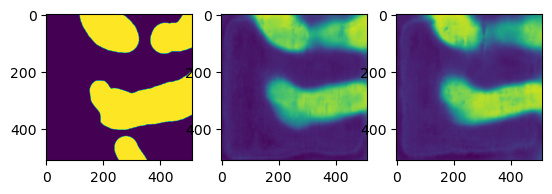

  0%|          | 0/100 [00:00<?, ?it/s]

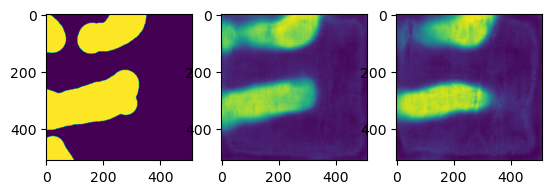

  0%|          | 0/100 [00:00<?, ?it/s]

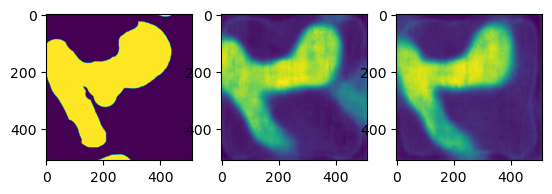

  0%|          | 0/100 [00:00<?, ?it/s]

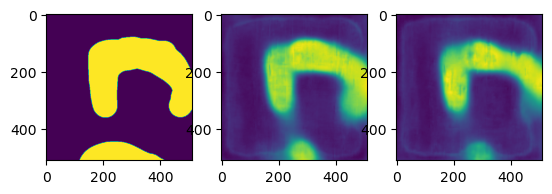

  0%|          | 0/100 [00:00<?, ?it/s]

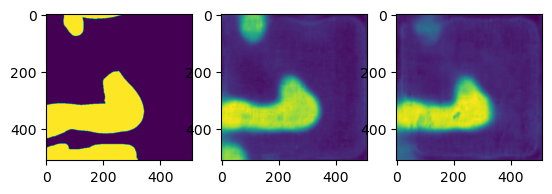

  0%|          | 0/100 [00:00<?, ?it/s]

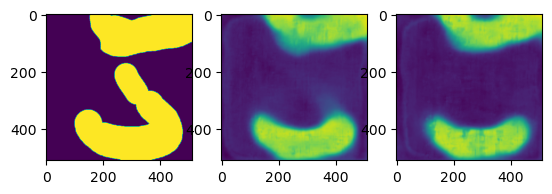

  0%|          | 0/100 [00:00<?, ?it/s]

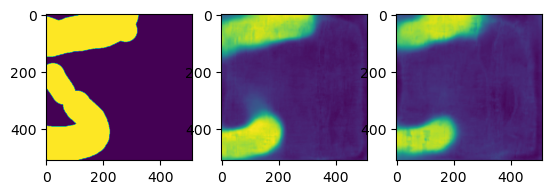

  0%|          | 0/100 [00:00<?, ?it/s]

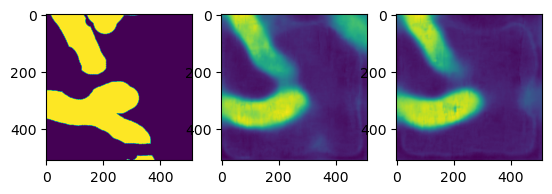

  0%|          | 0/100 [00:00<?, ?it/s]

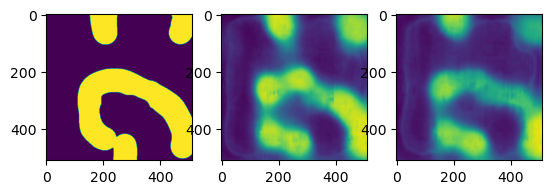

  0%|          | 0/100 [00:00<?, ?it/s]

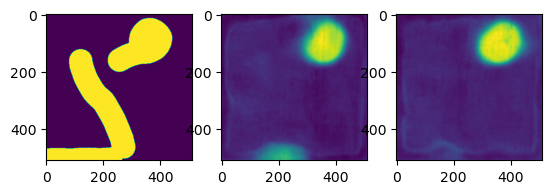

  0%|          | 0/100 [00:00<?, ?it/s]

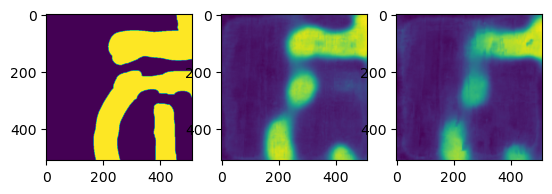

  0%|          | 0/100 [00:00<?, ?it/s]

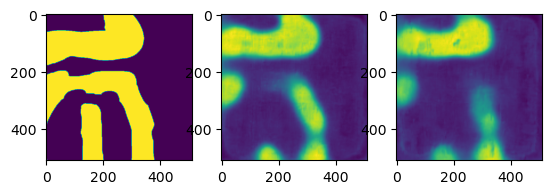

  0%|          | 0/100 [00:00<?, ?it/s]

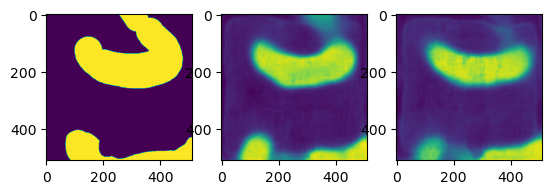

  0%|          | 0/100 [00:00<?, ?it/s]

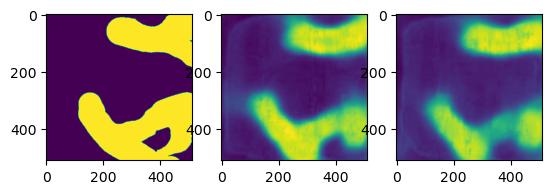

  0%|          | 0/100 [00:00<?, ?it/s]

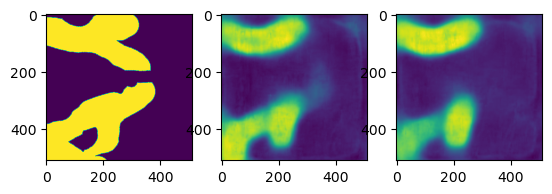

  0%|          | 0/100 [00:00<?, ?it/s]

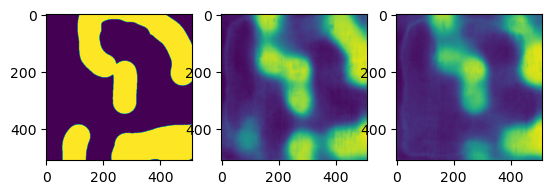

  0%|          | 0/100 [00:00<?, ?it/s]

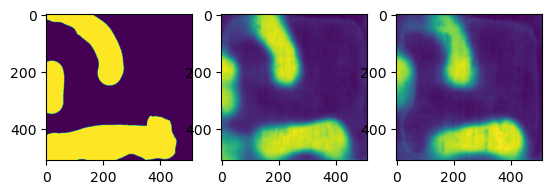

  0%|          | 0/100 [00:00<?, ?it/s]

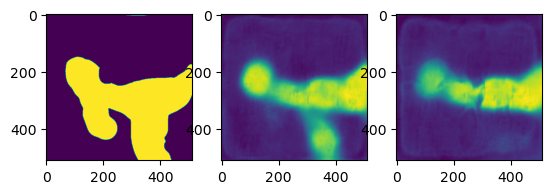

  0%|          | 0/100 [00:00<?, ?it/s]

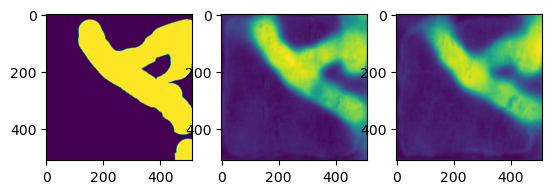

  0%|          | 0/100 [00:00<?, ?it/s]

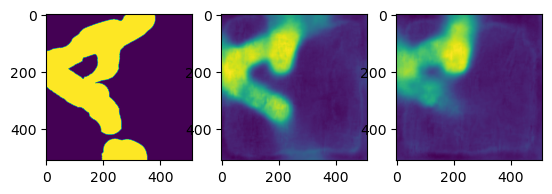

  0%|          | 0/100 [00:00<?, ?it/s]

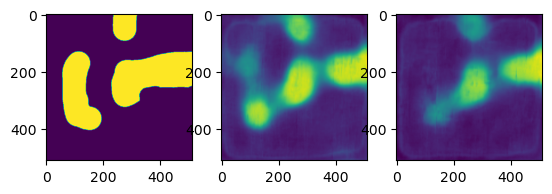

  0%|          | 0/100 [00:00<?, ?it/s]

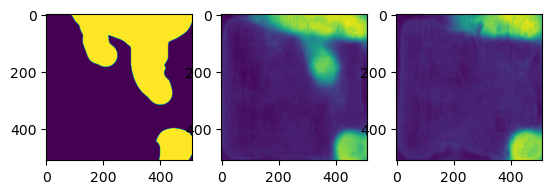

  0%|          | 0/100 [00:00<?, ?it/s]

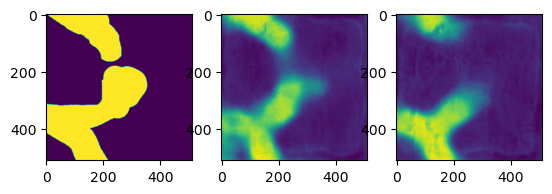

  0%|          | 0/100 [00:00<?, ?it/s]

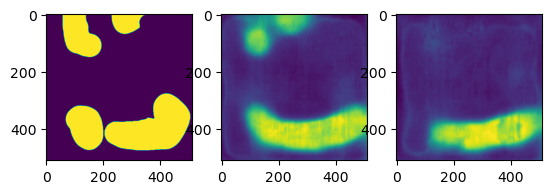

  0%|          | 0/100 [00:00<?, ?it/s]

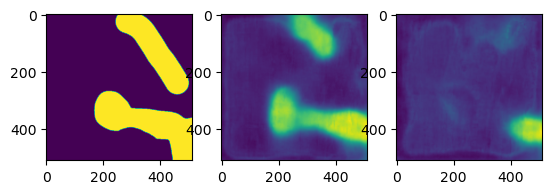

  0%|          | 0/100 [00:00<?, ?it/s]

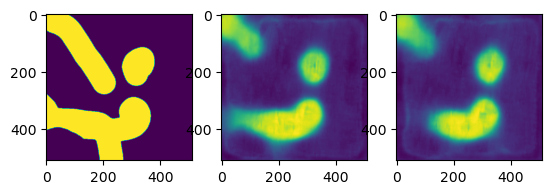

  0%|          | 0/100 [00:00<?, ?it/s]

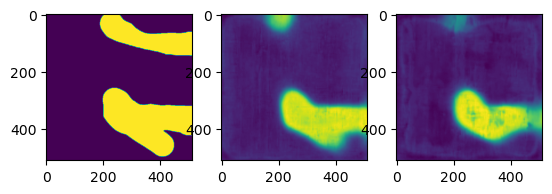

  0%|          | 0/100 [00:00<?, ?it/s]

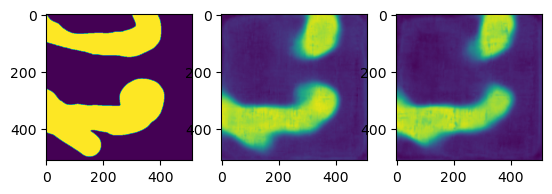

  0%|          | 0/100 [00:00<?, ?it/s]

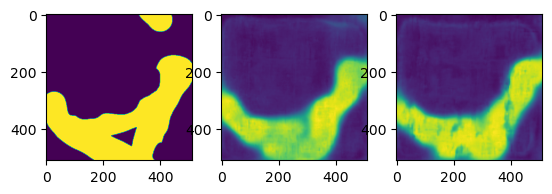

  0%|          | 0/100 [00:00<?, ?it/s]

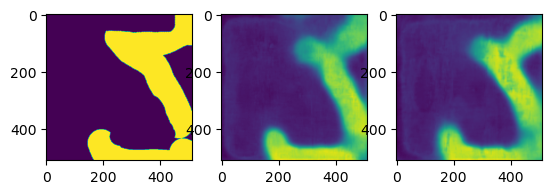

  0%|          | 0/100 [00:00<?, ?it/s]

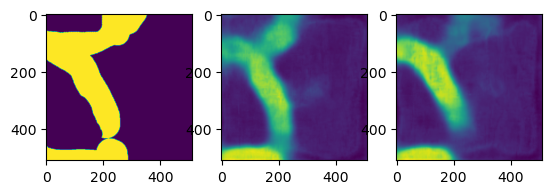

  0%|          | 0/100 [00:00<?, ?it/s]

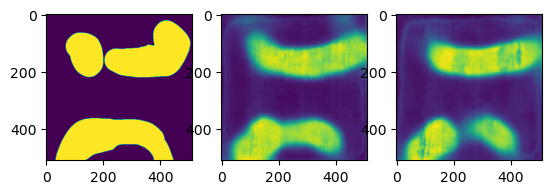

  0%|          | 0/100 [00:00<?, ?it/s]

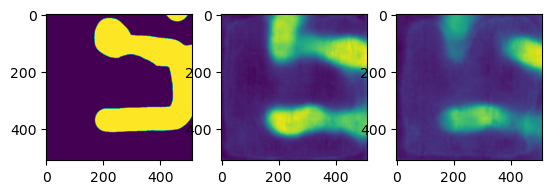

  0%|          | 0/100 [00:00<?, ?it/s]

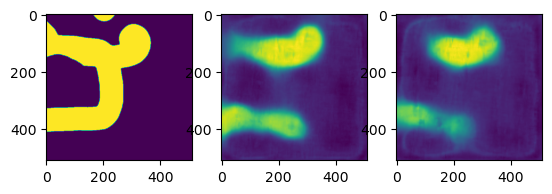

  0%|          | 0/100 [00:00<?, ?it/s]

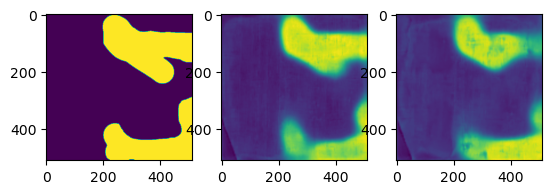

  0%|          | 0/100 [00:00<?, ?it/s]

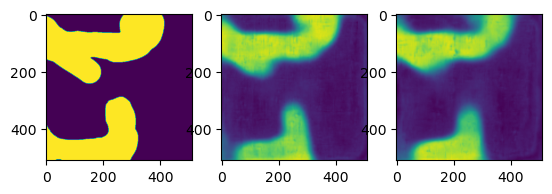

  0%|          | 0/100 [00:00<?, ?it/s]

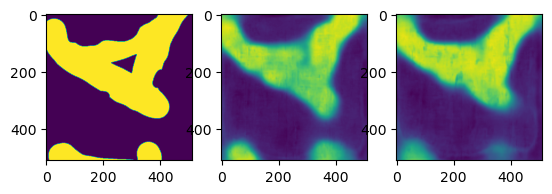

  0%|          | 0/100 [00:00<?, ?it/s]

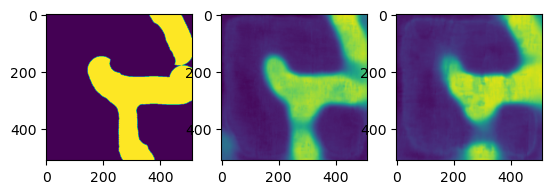

  0%|          | 0/100 [00:00<?, ?it/s]

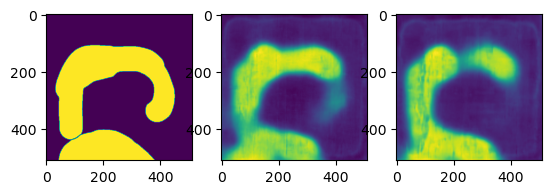

  0%|          | 0/100 [00:00<?, ?it/s]

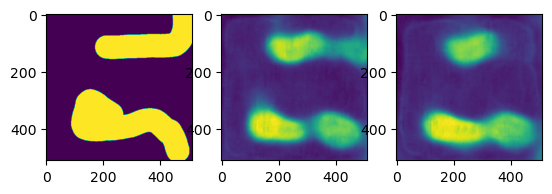

  0%|          | 0/100 [00:00<?, ?it/s]

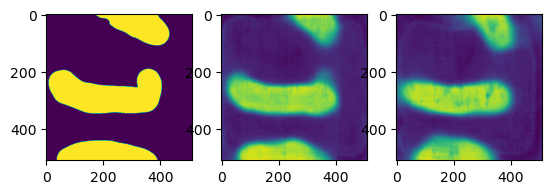

  0%|          | 0/100 [00:00<?, ?it/s]

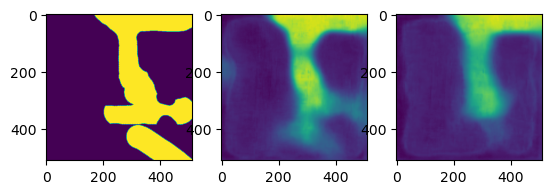

  0%|          | 0/100 [00:00<?, ?it/s]

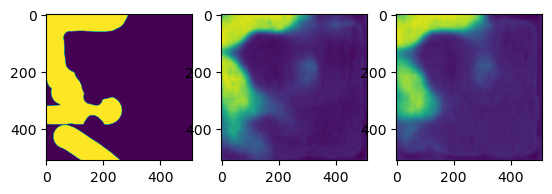

  0%|          | 0/100 [00:00<?, ?it/s]

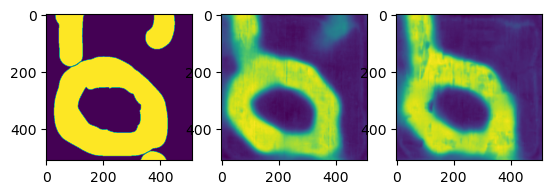

  0%|          | 0/100 [00:00<?, ?it/s]

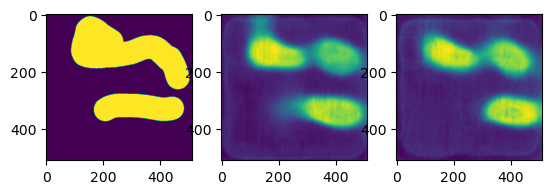

  0%|          | 0/100 [00:00<?, ?it/s]

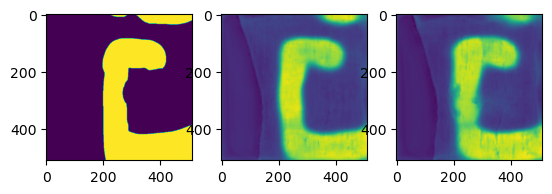

  0%|          | 0/100 [00:00<?, ?it/s]

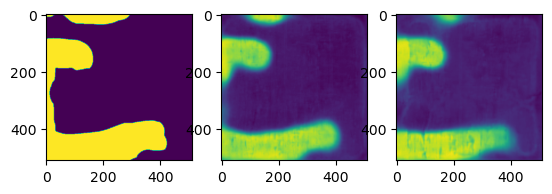

  0%|          | 0/100 [00:00<?, ?it/s]

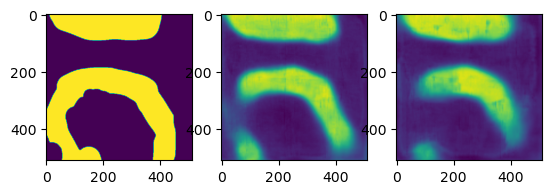

  0%|          | 0/100 [00:00<?, ?it/s]

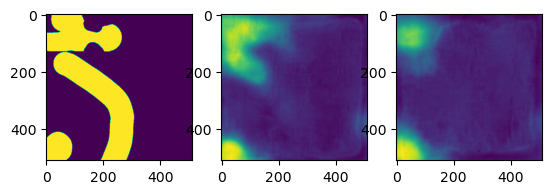

  0%|          | 0/100 [00:00<?, ?it/s]

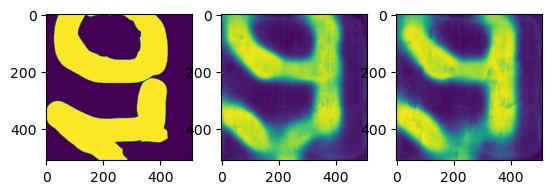

  0%|          | 0/100 [00:00<?, ?it/s]

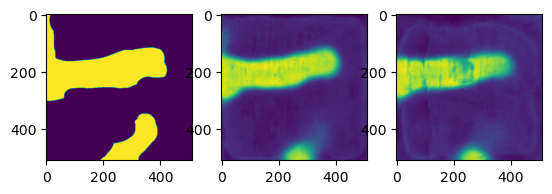

  0%|          | 0/100 [00:00<?, ?it/s]

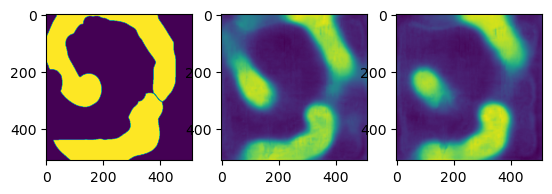

  0%|          | 0/100 [00:00<?, ?it/s]

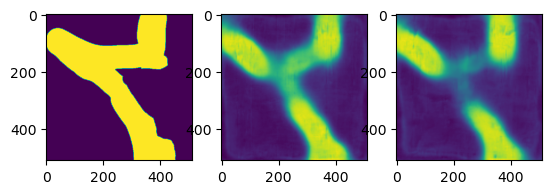

  0%|          | 0/100 [00:00<?, ?it/s]

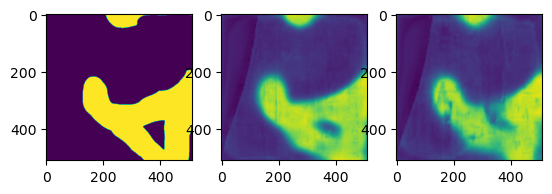

  0%|          | 0/100 [00:00<?, ?it/s]

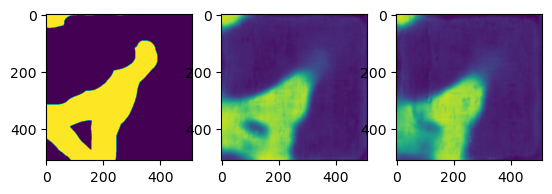

  0%|          | 0/100 [00:00<?, ?it/s]

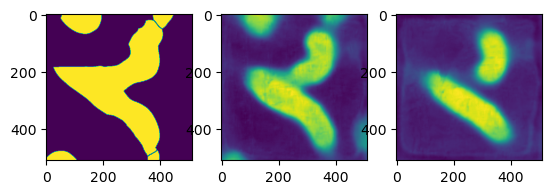

  0%|          | 0/100 [00:00<?, ?it/s]

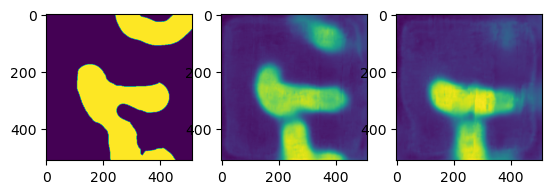

  0%|          | 0/100 [00:00<?, ?it/s]

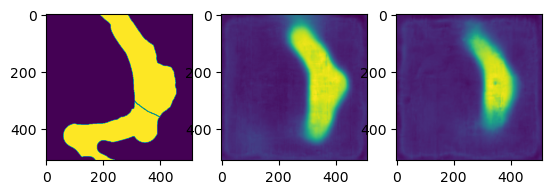

  0%|          | 0/100 [00:00<?, ?it/s]

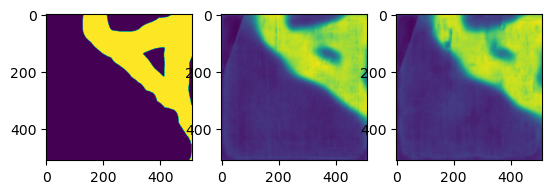

  0%|          | 0/100 [00:00<?, ?it/s]

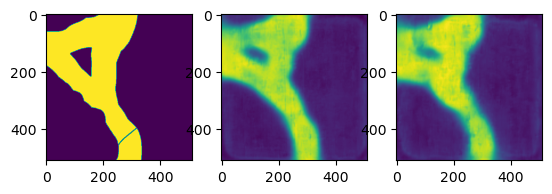

  0%|          | 0/100 [00:00<?, ?it/s]

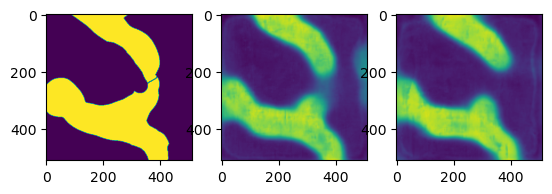

  0%|          | 0/100 [00:00<?, ?it/s]

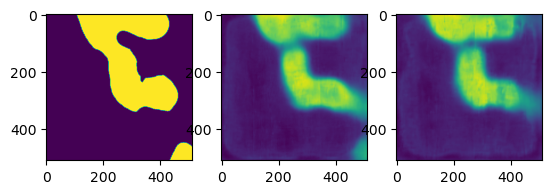

  0%|          | 0/100 [00:00<?, ?it/s]

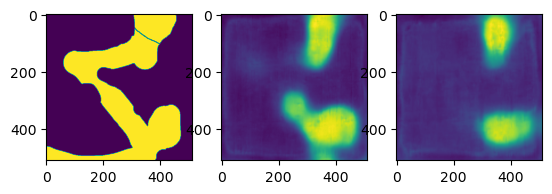

  0%|          | 0/100 [00:00<?, ?it/s]

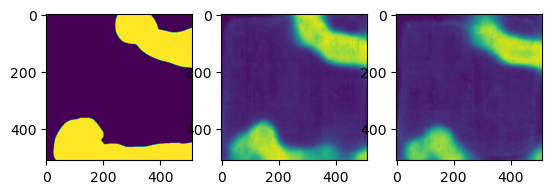

  0%|          | 0/100 [00:00<?, ?it/s]

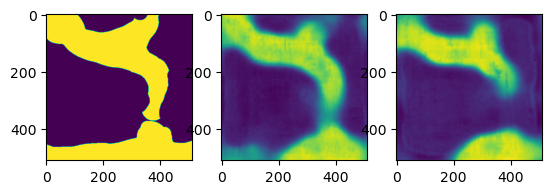

  0%|          | 0/100 [00:00<?, ?it/s]

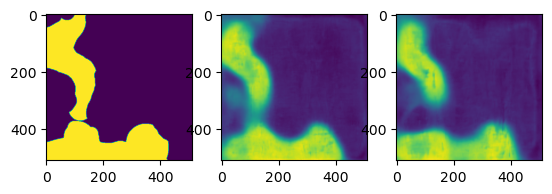

  0%|          | 0/100 [00:00<?, ?it/s]

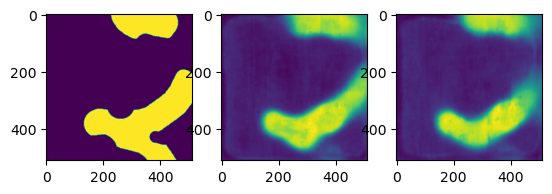

  0%|          | 0/100 [00:00<?, ?it/s]

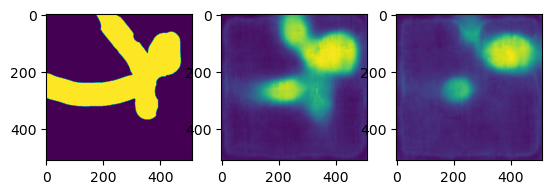

  0%|          | 0/100 [00:00<?, ?it/s]

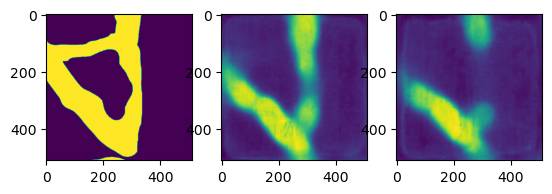

  0%|          | 0/100 [00:00<?, ?it/s]

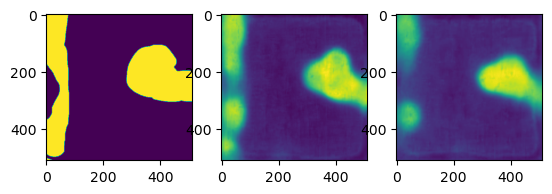

  0%|          | 0/100 [00:00<?, ?it/s]

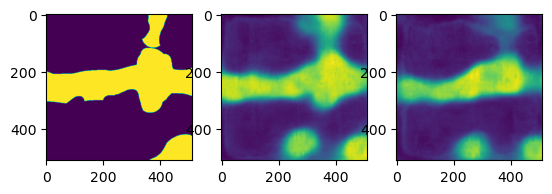

  0%|          | 0/100 [00:00<?, ?it/s]

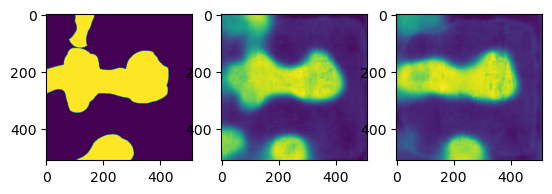

  0%|          | 0/100 [00:00<?, ?it/s]

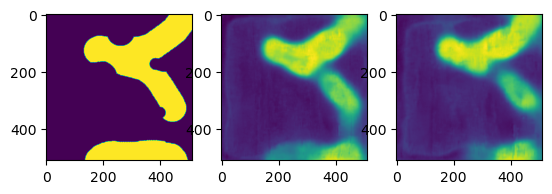

  0%|          | 0/100 [00:00<?, ?it/s]

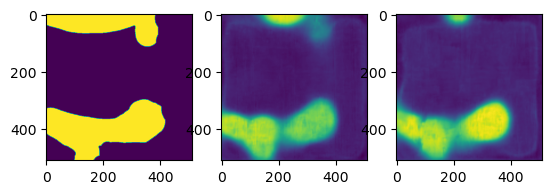

  0%|          | 0/100 [00:00<?, ?it/s]

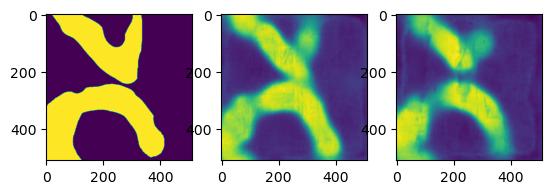

  0%|          | 0/100 [00:00<?, ?it/s]

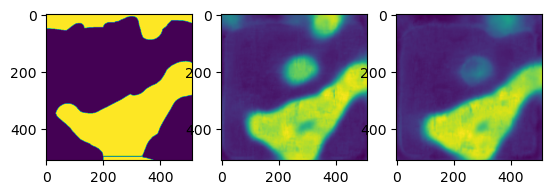

  0%|          | 0/100 [00:00<?, ?it/s]

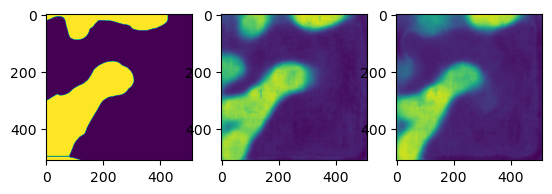

  0%|          | 0/100 [00:00<?, ?it/s]

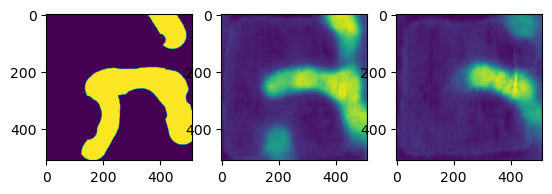

  0%|          | 0/100 [00:00<?, ?it/s]

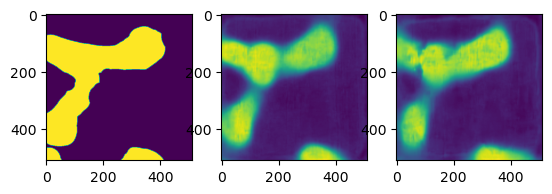

  0%|          | 0/100 [00:00<?, ?it/s]

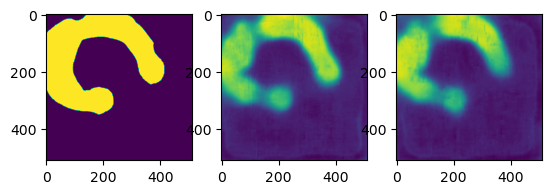

  0%|          | 0/100 [00:00<?, ?it/s]

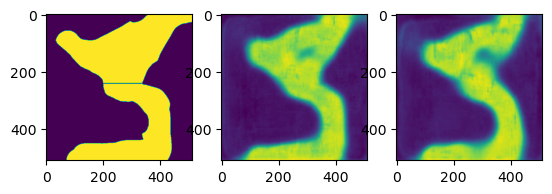

  0%|          | 0/100 [00:00<?, ?it/s]

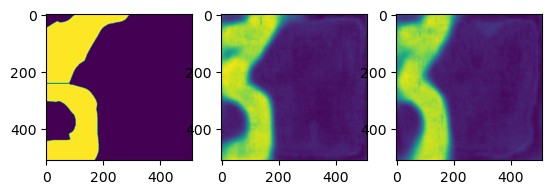

  0%|          | 0/100 [00:00<?, ?it/s]

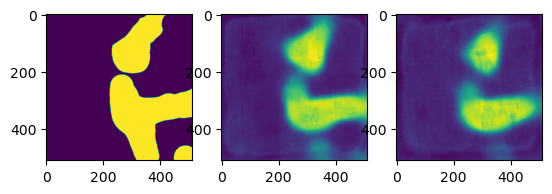

  0%|          | 0/100 [00:00<?, ?it/s]

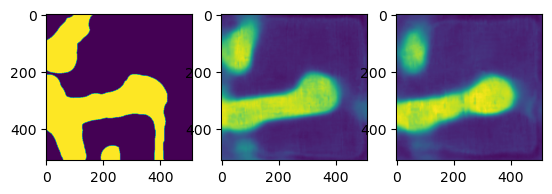

  0%|          | 0/100 [00:00<?, ?it/s]

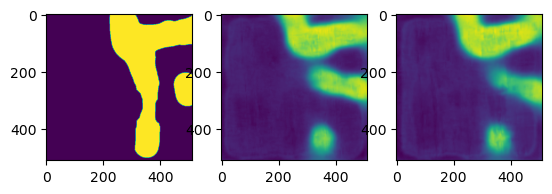

  0%|          | 0/100 [00:00<?, ?it/s]

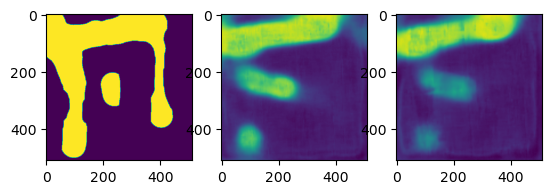

In [57]:
image,fragment_mask,mask_2d = read_image_mask('20231016151000',12,50,0)
mask_2d=(mask_2d*255).astype(np.uint8)
x1_list = list(range(0, image.shape[1]-CFG.tile_size+1, CFG.stride))
y1_list = list(range(0, image.shape[0]-CFG.tile_size+1, CFG.stride))
new_mask=np.zeros((image.shape[0],image.shape[1],30),dtype=np.uint8)
# model=torch.jit.load('')
for y1 in y1_list:
    for x1 in x1_list:
        y2 = y1 + CFG.tile_size
        x2 = x1 + CFG.tile_size
        if mask_2d[y1:y2,x1:x2].mean()>.25*255:
            fig,ax=plt.subplots(1,3)

            data=t(image=image[y1:y2,x1:x2,3:33])['image'].unsqueeze(0).to(device)
            noise=t2(image=image[y1:y2,x1:x2,36])['image'].unsqueeze(0).unsqueeze(0)
            # noise2=t2(image=image[y1:y2,x1:x2,0])['image'].unsqueeze(0).unsqueeze(0).repeat(1,1,30,1,1).to(device)

            noise=noise.repeat(1,1,30,1,1).to(device)
            ax[0].imshow(mask_2d[y1:y2,x1:x2])
            ax[1].imshow(F.interpolate( model(data)[0].unsqueeze(0).float(),scale_factor=4,mode='bilinear').squeeze(0).squeeze(0).detach().cpu().numpy())
            gates,gates_history,final_pred=attribute_z(data,noise,model,loss_func,N_STEPS,LR,BETA,SIZE)
            # gates2,gates_history,final_pred=attribute_z(data,noise2,model,loss_func,N_STEPS,LR,BETA,SIZE)
            1,1,30,512,512
            # print(gates.reshape(-1),gates2.reshape(-1))
            gates[gates<0.1]=0
            gates[gates!=0]=1
            gates=gates.repeat(CFG.tile_size,axis=-1).repeat(CFG.tile_size,axis=-2)
            mask_cutout=mask_2d[y1:y2,x1:x2].reshape(1,1,1,CFG.tile_size,CFG.tile_size).repeat(30,axis=2)
            new_mask[y1:y2,x1:x2,:]=(mask_cutout*gates).transpose(3,4,2,0,1).squeeze(-1).squeeze(-1)
            ax[2].imshow(F.interpolate(torch.Tensor(final_pred)[0].unsqueeze(0).float(),scale_factor=4,mode='bilinear').squeeze(0).squeeze(0).cpu().numpy())
            plt.show()

In [78]:
for i in range(30):
    Image.fromarray(new_mask[:,:,i]).convert('L').save(f'20231016151000/{i+15}.png')

# Visualize the 3d labels using Napari 

In [64]:
w,h,_=new_mask.shape

In [71]:
resized=np.stack([cv2.resize(new_mask[:,:,i],(int(h/32),int(w/32))) for i in range(30)],axis=2)

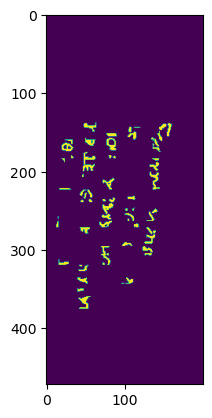

In [77]:
plt.imshow(resized[:,:,5])

In [74]:
from skimage import data
import napari
from napari.utils.translations import trans

viewer = napari.Viewer(ndisplay=3)

# add a 3D image
blobs = resized.astype(np.float32)
image_layer = viewer.add_image(
    blobs, rendering='mip', name='volume', blending='additive', opacity=0.25
)

# add the same 3D image and render as plane
# plane should be in 'additive' blending mode or depth looks all wrong
plane_parameters = {
    'position': (32, 32, 20),
    'normal': (0, 0, 1),
    'thickness': 1,
}

plane_layer = viewer.add_image(
    blobs,
    rendering='average',
    name='plane',
    depiction='plane',
    blending='additive',
    opacity=0.5,
    plane=plane_parameters
)
viewer.axes.visible = True
viewer.camera.angles = (45, 45, 45)
viewer.camera.zoom = 5
viewer.text_overlay.text = trans._(
    """
shift + click and drag to move the plane
press 'x', 'y' or 'z' to orient the plane along that axis around the cursor
press 'o' to orient the plane normal along the camera view direction
press and hold 'o' then click and drag to make the plane normal follow the camera
"""
)
viewer.text_overlay.visible = True
napari.run()
# if __name__ == '__main__':


# Another example from 20231210121321 using the lowres IBA method

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

[0.00228676 0.00285071 0.00294136 0.0036116  0.00351102 0.00347583
 0.0077828  0.00491827 0.00447251 0.01296519 0.8933338  0.969476
 0.68130314 0.7709663  0.18861686] [0.00210631 0.00169586 0.00253461 0.00338816 0.00171598 0.00656004
 0.71961325 0.5874122  0.61971897 0.44051746 0.93808776 0.45832625
 0.74763435 0.6116892  0.00364427]


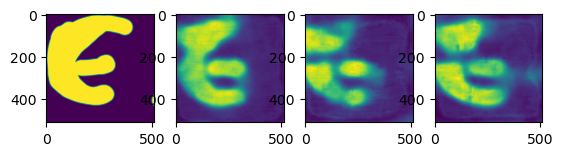

In [80]:
# 3291 3742 4241 4785
y1=3269
x1=3477
y2=y1+SIZE
x2=x1+SIZE
LR=2e-1
BETA=2
# image,fragment_mask,mask_2d = read_image_mask('20231210121321',12,50,0)

fig,ax=plt.subplots(1,4)
data=t(image=image[y1:y2,x1:x2,3:33])['image'].unsqueeze(0).to(device)
noise=t2(image=image[y1:y2,x1:x2,36])['image'].unsqueeze(0).unsqueeze(0)
noise2=t2(image=image[y1:y2,x1:x2,0])['image'].unsqueeze(0).unsqueeze(0).repeat(1,1,30,1,1).to(device)

noise=noise.repeat(1,1,30,1,1).to(device)
ax[0].imshow(mask_2d[y1:y2,x1:x2])
ax[1].imshow(F.interpolate( m(data)[0].unsqueeze(0).float(),scale_factor=4,mode='bilinear').squeeze(0).squeeze(0).detach().cpu().numpy())
gates,gates_history,final_pred=attribute_z_lowres(data,noise,m,loss_func,N_STEPS,LR,BETA,SIZE)
gates2,gates_history2,final_pred2=attribute_z_lowres(data,noise2,m,loss_func,N_STEPS,LR,BETA,SIZE)

print(gates.reshape(-1),gates2.reshape(-1))
gates[gates<0.1]=0
gates[gates!=0]=1

ax[2].imshow(F.interpolate(torch.Tensor(final_pred)[0].unsqueeze(0).float(),scale_factor=4,mode='bilinear').squeeze(0).squeeze(0).cpu().numpy())
ax[3].imshow(F.interpolate(torch.Tensor(final_pred2)[0].unsqueeze(0).float(),scale_factor=4,mode='bilinear').squeeze(0).squeeze(0).cpu().numpy())

plt.show()

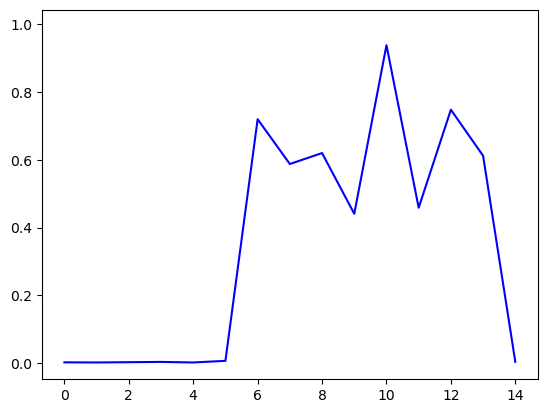

In [81]:
animate_history(np.array([d.sigmoid().cpu().numpy() for d in gates_history2]).reshape(-1,15))

# Bootstrapping diffmask for tighter letter bounds
You can also run diffmask's sampling based approach for a couple iterations and taking the median layer importance for the volumes

In [61]:
all_gates=[]
for _ in range(10):
    loss_func2= smp.losses.SoftBCEWithLogitsLoss()
    loss_func= lambda x,y:loss_func2(x,y)
    noise=t2(image=image[y1:y2,x1:x2,36])['image'].unsqueeze(0).unsqueeze(0).repeat(1,1,30,1,1).to(device)
    gates,gates_history,final_pred=attribute_z_diffmask(data,noise,m,loss_func,200,5e-2,2,SIZE,False,2)
    all_gates.append(gates.reshape(2,-1))
    # animate_history(gates_history)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

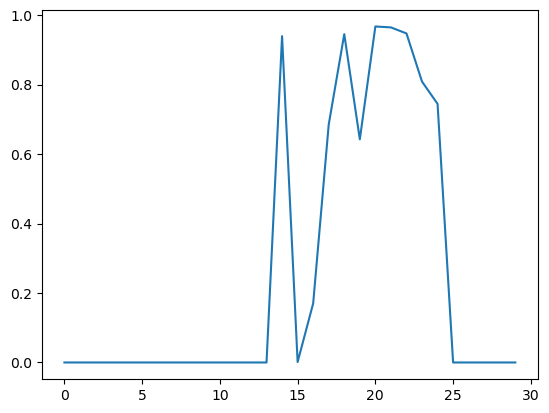

In [65]:
plt.plot(np.median(np.array(all_gates).reshape(-1,30),axis=0))